# CoE 197M Final Project
#### Marvin Moyco (2015-09359)

This notebook involves using STL-10 10k dataset to perform Low-dimensionality reduction via PCA and using the optimal z-dim (from PCA) to GMM code.

Due to computational resource limitation, I decided to use greyscale images (converted using PIL module) and rescaled (65 x 65 pixels) images.
#### References: 
* [STL-10 Dataset](https://ai.stanford.edu/~acoates/stl10/)
* [Martin Tutek](https://github.com/mttk/STL10)
* [Prof. Atienza's PCA code](https://github.com/roatienza/ml/tree/master/pca)
* [Prof. Atienza's GMM code](https://github.com/roatienza/ml/tree/master/gmm/notebook)
* [Datacamp PCA Tutorial](https://www.datacamp.com/community/tutorials/principal-component-analysis-in-python)
* [MSE Calculation Reference](https://github.com/chia56028/PSNR-Calculator-for-Images)
* [SVD and PCA Relationship](https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8)
* [Sci-kit Learn's](https://github.com/scikit-learn/scikit-learn/blob/42aff4e2edd8e8887478f6ff1628f27de97be6a3/sklearn/mixture/_base.py)[ GMM Class](https://github.com/scikit-learn/scikit-learn/blob/42aff4e2e/sklearn/mixture/_gaussian_mixture.py#L434)

#### Importing of necessary libraries

In [ ]:
from __future__ import print_function
from __future__ import absolute_import
from __future__ import division
import math
import os, sys, tarfile, errno
import numpy as np
#Comment out the 'pca_func' if you did not download pca_func.py from the repo or you will not use the multiprocessing method 
import pca_func
from multiprocessing import Pool
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from PIL import Image

### Part 1: Low dimensionality reduction using PCA

Using STL-10 10k unlabeled dataset, build a PCA with the minimum dimensionality and best reconstruction quality
Plot 𝑀𝑆𝐸 vs 𝒛−𝑑𝑖𝑚

Mean squared error for the entire test set vs 𝒛 code dimensionality

Try the following dims: {32, 64, 256, 512, 1028, 2046, 4098}

#### Reading bin files from internet

The following code for the downloading, extraction, and reading of the binary files are from the code of [Martin Tutek](https://github.com/mttk/STL10).

There are several functions here but the most important for this notebook will be **download_and_extract()** and **read_all_images()**

In [ ]:

if sys.version_info >= (3, 0, 0):
    import urllib.request as urllib # ugly but works
else:
    import urllib

try:
    from imageio import imsave
except:
    from scipy.misc import imsave

print(sys.version_info) 

# image shape
HEIGHT = 96
WIDTH = 96
DEPTH = 3


# size of a single image in bytes
SIZE = HEIGHT * WIDTH * DEPTH

# path to the directory with the data
DATA_DIR = './data'

# url of the binary data
DATA_URL = 'http://ai.stanford.edu/~acoates/stl10/stl10_binary.tar.gz'

# path to the binary train file with image data (5000 images)
TRAIN_DATA_PATH = './data/stl10_binary/train_X.bin'

#path to binary train file labels
TRAIN_OUT_PATH = './data/stl10_binary/train_y.bin'

#path to binary test file with image data (8000 images)
TEST_DATA_PATH = './data/stl10_binary/test_X.bin'

#path to binary train file labels
TEST_OUT_PATH = './data/stl10_binary/test_y.bin'

#path to the binary unsupervised data binary file (10000 images)
UNLABELED_DATA_PATH = './data/stl10_binary/unlabeled_X.bin'

#path to class names
CLASS_NAME_PATH = './data/stl10_binary/class_names.txt'

def read_labels(path_to_labels):
    """
    :param path_to_labels: path to the binary file containing labels from the STL-10 dataset
    :return: an array containing the labels
    """
    with open(path_to_labels, 'rb') as f:
        labels = np.fromfile(f, dtype=np.uint8)
        return labels

def read_all_images(path_to_data):
    """
    :param path_to_data: the file containing the binary images from the STL-10 dataset
    :return: an array containing all the images
    """

    with open(path_to_data, 'rb') as f:
        # read whole file in uint8 chunks
        everything = np.fromfile(f, dtype=np.uint8)

        # We force the data into 3x96x96 chunks, since the
        # images are stored in "column-major order", meaning
        # that "the first 96*96 values are the red channel,
        # the next 96*96 are green, and the last are blue."
        # The -1 is since the size of the pictures depends
        # on the input file, and this way numpy determines
        # the size on its own.

        images = np.reshape(everything, (-1, 3, 96, 96))

        # Now transpose the images into a standard image format
        # readable by, for example, matplotlib.imshow
        # You might want to comment this line or reverse the shuffle
        # if you will use a learning algorithm like CNN, since they like
        # their channels separated.
        images = np.transpose(images, (0, 3, 2, 1))
        return images
    
def plot_images(images, title, n_images=4): #From Prof. Atienza's PCA Code
    plt.figure(figsize=(15,15))
    plt.suptitle(title, fontsize=20)
    side = int(math.sqrt(n_images))
    for i in range(n_images):
        plt.subplot(side, side, i + 1)
        image = images[i]
        plt.imshow(image,cmap="gray",interpolation = "bicubic")
        plt.axis('off')

    plt.show()
    plt.close('all')

def download_and_extract():
    """
    Download and extract the STL-10 dataset
    :return: None
    """
    dest_directory = DATA_DIR
    if not os.path.exists(dest_directory):
        os.makedirs(dest_directory)
    filename = DATA_URL.split('/')[-1]
    filepath = os.path.join(dest_directory, filename)
    if not os.path.exists(filepath):
        def _progress(count, block_size, total_size):
            sys.stdout.write('\rDownloading %s %.2f%%' % (filename,
                float(count * block_size) / float(total_size) * 100.0))
            sys.stdout.flush()
        filepath, _ = urllib.urlretrieve(DATA_URL, filepath, reporthook=_progress)
        print('Downloaded', filename)
        tarfile.open(filepath, 'r:gz').extractall(dest_directory)
        
if __name__ == "__main__":
    # download data if needed
    download_and_extract()

#### Loading bin files and initializing variables

Before proceeding in this point, make sure that the STL-10 dataset is divided into these files as well as stored in these folders: (words enclosed in "" is a folder)
Main folder:

           "data"
              |
              | 
              |-- stl10_binary.tar.gz (compressed file containing data 2.57 Gb)
              |--"stl10_binary"
                        |
                        |--- class_name.txt (Names of labels in output files)
                        |
                        |--- fold_indices.txt
                        |
                        |--- test_X.bin (test input dataset)
                        |
                        |--- test_y.bin (test output dataset)
                        |
                        |--- train_X.bin (train input dataset)
                        |
                        |--- train_y.bin (train output dataset)
                        |
                        |--- unlabeled_X.bin (unlabeled input dataset)
                        
                        
download_and_extract() dunction will extract files in this structure.        

In [3]:
#Initializing important variables
input_w = 65
input_h = 65
n_samples_test = 8000
n_samples_train = 5000
n_samples_unlabeled = 10000
dims = [32,64,256,512,1028,2046,3062,4098]

#Reading all possible data input (takes a while to finish. Be patient!)
train = read_all_images(TRAIN_DATA_PATH)
test = read_all_images(TEST_DATA_PATH)
test_index = np.random.choice(np.arange(n_samples_test),size=(n_samples_test),replace=False)
unlabeled = read_all_images(UNLABELED_DATA_PATH)

#Reading train and test labels
train_labels = read_labels(TRAIN_OUT_PATH)
test_labels = read_labels(TEST_OUT_PATH)
cluster_names = {}

#Reading class name
with open(CLASS_NAME_PATH, mode="r") as file:
    lines = file.readlines()
    for index in range(len(lines)):
        cluster_names[lines[index].strip()] = index + 1

#Randomizing Test and Unlabeled Dataset
unlabeled_random_index = np.random.choice(np.arange(n_samples_unlabeled),size=(n_samples_unlabeled),replace=False)
unlabeled.shape,unlabeled_random_index.shape
unlabeled_random_index.shape
input_dataset = unlabeled[unlabeled_random_index]

input_dataset.shape,train.shape,test.shape
#plot_images(input_dataset,"Original Images (Before PCA)")

((10000, 96, 96, 3), (5000, 96, 96, 3), (8000, 96, 96, 3))

In [4]:
cluster_names

{'airplane': 1,
 'bird': 2,
 'car': 3,
 'cat': 4,
 'deer': 5,
 'dog': 6,
 'horse': 7,
 'monkey': 8,
 'ship': 9,
 'truck': 10}

#### Converting Images (Resizing and Greyscale Conversion) All Datasets (Train, Test, Unlabeled)

Resizing and Color Conversion is done because my current machine cannot handle the input when I used RGB Images. The processing time of PCA usually took 1-2 hours and I needed to separate each layer (r,g,b) before PCA.

Starting Conversion for Unlabeled Dataset....
Input Images Dataset (Unlabeled):
Shape: (10000, 65, 65), Size: 42250000


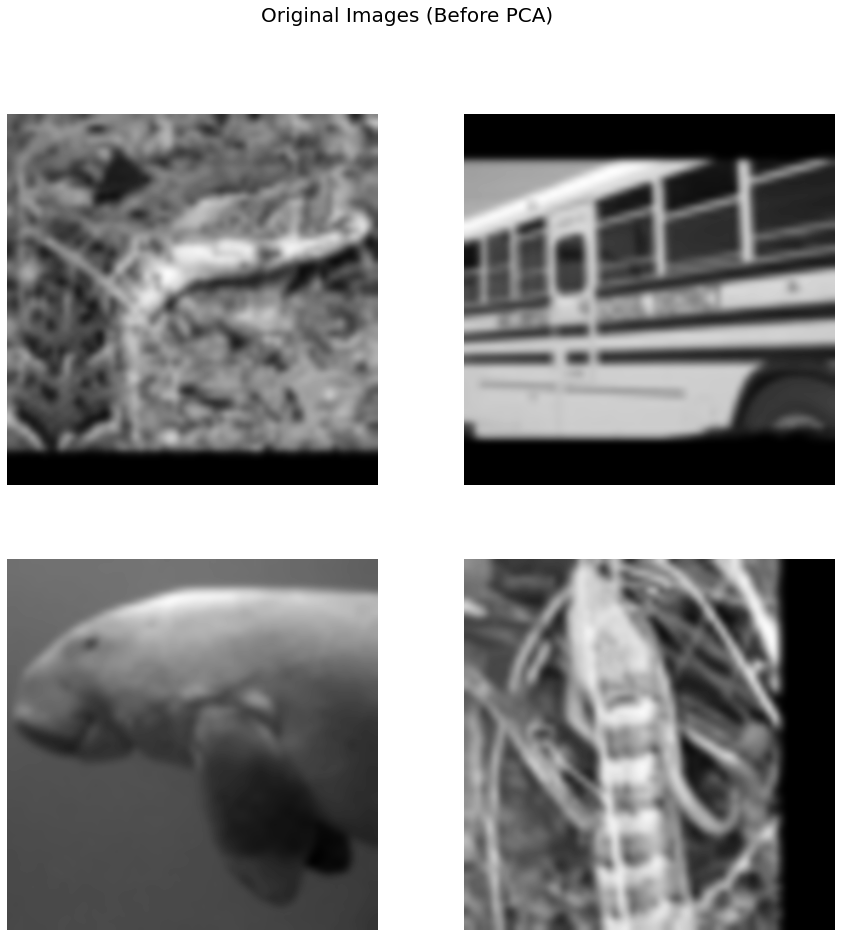

Starting Conversion for Train Dataset....
Input Images Dataset (Unlabeled):
Shape: (5000, 65, 65), Size: 21125000


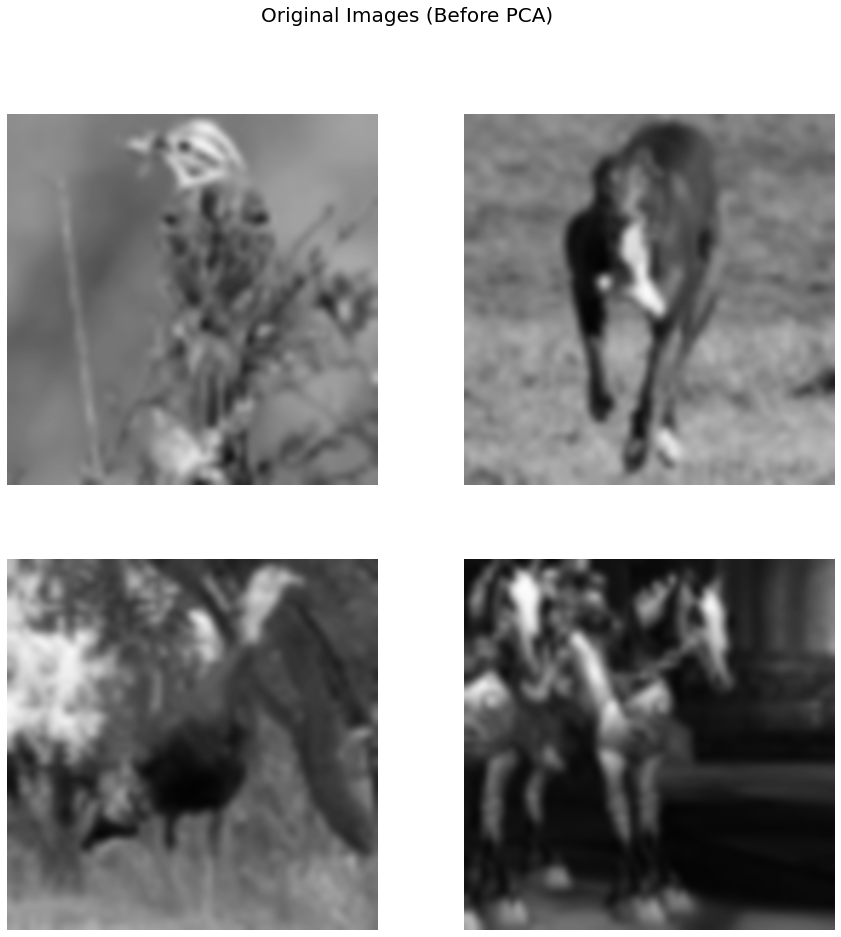

Starting Conversion for Test Dataset....
Input Images Dataset (Unlabeled):
Shape: (8000, 65, 65), Size: 33800000


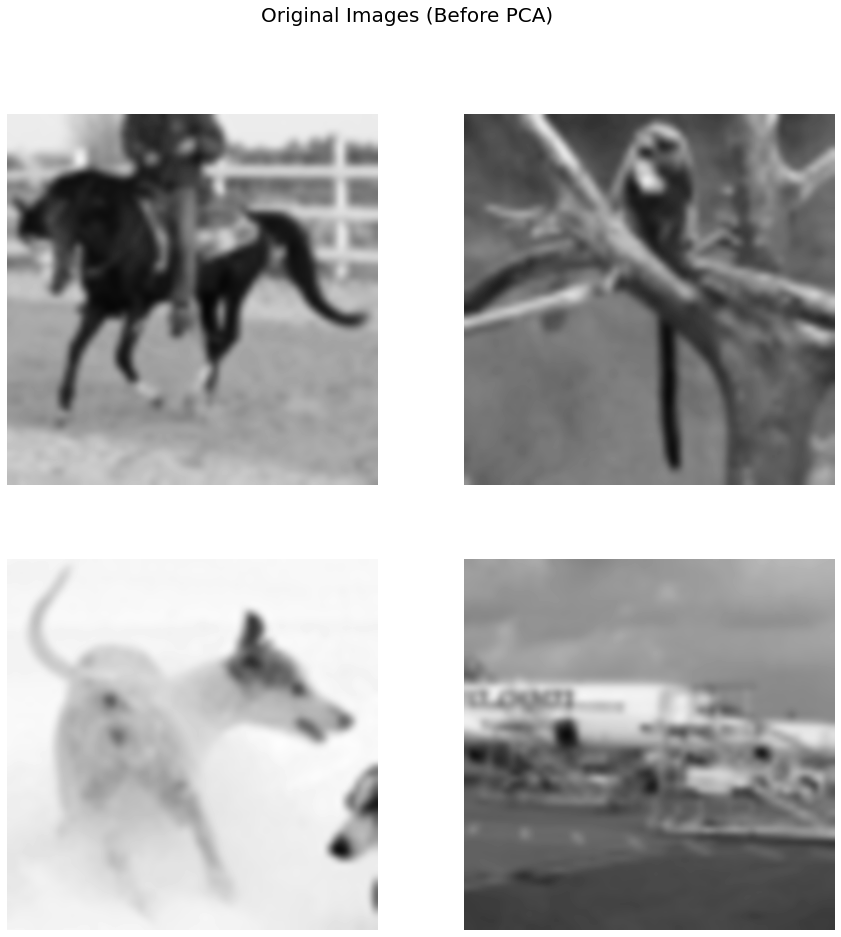

In [5]:
#Convert to PIL Image object
pil_images = []

pca_input_unlabeled = np.zeros((n_samples_unlabeled,input_w,input_h))
pca_input_train = np.zeros((n_samples_train,input_w,input_h))
pca_input_test = np.zeros((n_samples_test,input_w,input_h))
verbose = False

#For Unlabeled Dataset
print("===========================================================================================")
print("Starting Conversion for Unlabeled Dataset....")
for index_unlabeled in range(n_samples_unlabeled):
    upil_image = Image.fromarray(input_dataset[index_unlabeled])
    if verbose:
        print("===========================================================================================")
        print("Image {}".format(index_unlabeled))
        print("Before Conversion:")
        print("Size: {}, Mode: {}".format(upil_image.size,upil_image.mode))
    #Resize
    #Decided to choose this size after trial and error that works for my machine and process time is not very long
    upil_image = upil_image.resize((input_w,input_h)) 
    #Convert to Greyscale Image
    upil_image = upil_image.convert(mode='L')
    if verbose:
        print("After Conversion:")
        print("Size: {}, Mode: {}".format(upil_image.size,upil_image.mode))
    #Convert to Numpy ndarray
    upil_array = np.asarray(upil_image)
    #Add to input array
    pca_input_unlabeled[index_unlabeled] = upil_array/255.
    
#Print Data about Input Images
print("===========================================================================================")
print("Input Images Dataset (Unlabeled):")
print("Shape: {}, Size: {}".format(pca_input_unlabeled.shape,pca_input_unlabeled.size))
plot_images(pca_input_unlabeled,"Original Images (Before PCA)")

#For Train Dataset
print("===========================================================================================")
print("Starting Conversion for Train Dataset....")
for index_train in range(n_samples_train):
    trpil_image = Image.fromarray(train[index_train])
    if verbose:
        print("===========================================================================================")
        print("Image {}".format(index_train))
        print("Before Conversion:")
        print("Size: {}, Mode: {}".format(trpil_image.size,trpil_image.mode))
    #Resize
    #Decided to choose this size after trial and error that works for my machine and process time is not very long
    trpil_image = trpil_image.resize((input_w,input_h)) 
    #Convert to Greyscale Image
    trpil_image = trpil_image.convert(mode='L')
    if verbose:
        print("After Conversion:")
        print("Size: {}, Mode: {}".format(trpil_image.size,trpil_image.mode))
    #Convert to Numpy ndarray
    trpil_array = np.asarray(trpil_image)
    #Add to input array
    pca_input_train[index_train] = trpil_array/255.
    
#Print Data about Input Images
print("===========================================================================================")
print("Input Images Dataset (Unlabeled):")
print("Shape: {}, Size: {}".format(pca_input_train.shape,pca_input_train.size))
plot_images(pca_input_train,"Original Images (Before PCA)")


#For Test Dataset
print("===========================================================================================")
print("Starting Conversion for Test Dataset....")
for index_test in range(n_samples_test):
    tepil_image = Image.fromarray(test[index_test])
    if verbose:
        print("===========================================================================================")
        print("Image {}".format(index_test))
        print("Before Conversion:")
        print("Size: {}, Mode: {}".format(tepil_image.size,tepil_image.mode))
    #Resize
    #Decided to choose this size after trial and error that works for my machine and process time is not very long
    tepil_image = tepil_image.resize((input_w,input_h)) 
    #Convert to Greyscale Image
    tepil_image = tepil_image.convert(mode='L')
    if verbose:
        print("After Conversion:")
        print("Size: {}, Mode: {}".format(tepil_image.size,tepil_image.mode))
    #Convert to Numpy ndarray
    tepil_array = np.asarray(tepil_image)
    #Add to input array
    pca_input_test[index_test] = tepil_array/255.
    
#Print Data about Input Images
print("===========================================================================================")
print("Input Images Dataset (Unlabeled):")
print("Shape: {}, Size: {}".format(pca_input_test.shape,pca_input_test.size))
plot_images(pca_input_test,"Original Images (Before PCA)")

#### Sci-kit PCA Method

This part, will use sci-kit learns PCA class to do dimensionality reduction. This is used as a verification on whether the actual code works (using numpy only). This has two parts: **Normal method** and **Multi-processed method**. Both have the same goal, using fit_transform() to get the principal components but they differon how to accomplish it.



#### Normal Method

This method uses the normal for loop to iterate through every dimension that will be used (stored in **dims** list). The result will be placed on a list **data_matrices**.

A quick explanation of the code block:
The dataset is reshaped to be a 2D matrix (from 4D matrix) such that the data is unchanged. The loop cycles through each dimension in dims lists and in each iteration does the following: 
* creates a PCA object for the specific dimension
* Uses fit_transform() to get the data matrix from the PCA object 
* Saves both the data matrix and PCA object into separate lists **pca_objects** and **data_matrices** respectively

The execution time for this block is usually long (due to the 10k samples as well as the dimensions to loop).

The **fit_transform()** function uses SVD to fit the model and compute the principal components by default. The dataset is also automatically centered and normalized before fitting. Reference that helped me understand the function: [Stackoverflow link](https://stackoverflow.com/questions/61282874/pca-matrix-with-sklearn)

In [ ]:
%%time
#PCA using sci-kit function fit_transform()
reshaped_dataset = pca_input.reshape((n_samples_unlabeled,-1))
reshaped_dataset.shape
data_matrices = []
pca_objects = []
for dim in dims:
    pca = PCA(n_components=dim)
    pca_objects.append(pca)
    data_matrix = pca.fit_transform(reshaped_dataset)
    data_matrices.append(data_matrix)
    print(data_matrix.shape)

#### Multiprocessed Method

This method uses Python's multiprocessing module to divide the work on several processes to speed up the execution time. However, this method is still limited by the user's hardware so substantial hardware capabilities are required. In my computer, I managed to reduce the time by **25%** (though this not not measured repeatedly)

This part is similar to the previous part. The only difference is the use of multiprocessing to try and spread out the processing of each dimension (since they are independent of each other) and speed up the execution time.

Due to some problems in using multiprocessing module in Jupyter notebook, I had to put the function in a separate py file (**pca_func.py**) for the module to work.

In [ ]:
%%time
#PCA but using multiprocessing to probably reduce execution time
#Result: Minimal improvement in execution time :(
if __name__ == '__main__':
    dataset = pca_input.reshape((n_samples_unlabeled,-1))
    input_arg = []
    for i in range(len(dims)):
        input_tuple = (dataset,dims[i])
        input_arg.append(input_tuple)
    #print(input_arg)
    with Pool(processes=3) as pool:
        output = pool.starmap(pca_func.pca_function,input_arg )

#### Decoding and printing of images

In this part, after the dimensionality reduction, the code is then decoded back into images by using **inverse_transform()**. The images are then plotted to show the difference between the original and the decoded dataset.

The **inverse_transform()** decodes the data matrix to its original subspace by multiplying the data matrix to the principal components matrix (using the .components_ attribute) and then backprojecting by multiplying standard deviation and adding the mean of the original dataset.

\begin{equation*}
    X\,=\, D*P*\sigma \,+\, \mu
\end{equation*}
X = Reconstructed dataset

D = Data matrix

P = Principal components matrix

In [ ]:
#Decoding an Image from principal component back to RGB format
decoded_images = []
plot_images(pca_input,"Original Images (Before PCA)")
for i in range(len(pca_objects)):
    decoded_reshape = pca_objects[i].inverse_transform(data_matrices[i])
    decoded_dataset = np.uint8(decoded_reshape.reshape((n_samples_unlabeled,input_w,input_h)))
    decoded_images.append(decoded_dataset)
    plot_images(decoded_dataset,"Decoded Images (After PCA) Dims: {}".format(str(dims[i])))
 

# Uncomment out the code block below if you are using the multi-processing method to print the results of that method.

#output_pca_objs = []
#output_data_matrices = []
#for elem in output:
#    output_pca_objs.append(elem[0])
#    output_data_matrices.append(elem[1])
#output_decoded_images = []
#for i in range(len(output_pca_objs)):
#    output_decoded_reshape = output_pca_objs[i].inverse_transform(output_data_matrices[i])
#    output_decoded_dataset = np.uint8(output_decoded_reshape.reshape((n_samples_unlabeled,input_w,input_h)))
#    output_decoded_images.append(output_decoded_dataset)
#    plot_images(output_decoded_dataset,"Decoded Images (After PCA and using Multiprocessing) Dims: {}".format(str(dims[i])))

## Part 1 Main Code: PCA without using pre-built PCA functions

In this part, PCA will still be used on the original dataset but without using the sci-kit learn module. The main reference for this part will be Prof. Atienza's PCA code algorithm.

#### Dataset Centering and Fitting

In this part, the dataset is centered by subtracting the mean to each datapoint. This will cause the center of the distribution to be 0.

\begin{equation*}
    x_{n} \,=\,x_{n}\,-\,\mu
\end{equation*}

Next, the dataset is divided by the standard deviation. This will result in the resulting dataset to have a standard deviation of 1.

\begin{equation*}
    x_{n} \,=\,\frac{x_{n}}{\sigma}
\end{equation*}

The resulting dataset will have a mean of 0 and a standard deviation of 1. So, this function transforms the dataset into a Standard Normal Distribution.

The function can also be used for backprojection where the reverse operations are done compared to the above directions. The standard deviation is multiplied to cancel the division done earlier and the mean is added to cancel the mean subtraction.

\begin{equation*}
    x_{n} \,=\,x_{n}\,+\,\mu
\end{equation*}

\begin{equation*}
    x_{n} \,=\,x_{n}*\sigma
\end{equation*}

In [6]:
def snd(dataset,mean,std,direction = "Forward"):
    #Forward means that when the dataset is centered and fitted such that mean = 0 and std = 1
    if direction == "Forward":
        result = (dataset - mean)/std
    #Reverse will just cancel the operations done on the dataset by the Forward part.
    elif direction == "Reverse":
        result = (dataset + mean)*std
    return result

#### Splitting and Merging of Color Channels

Since the input dataset is composed of RGB images with size of 96 pixels by 96 pixels, it will also have 3 layers of 96x96 pixels for each color channel in an RGB (R,G,and B channel). The functions below either splits the channels to 3 lists for independent processing or merges the splitted 3 channels into a 1 list (RGB image) for post-processing the data.

This will become pertinent in the normalization and the post-processing (MSE) so that proper mean and standard deviation can be applied to each channel. Also, processing each channel's eigenvector are done so that proper principal components per channel is produced. (I think this is because when I do not separate the channels, the features mixed up in each channel that produces incorrect results)

#### NOTE: This will not be used since I decided to use greyscale images that only has 1 channel.

In [7]:
def split_channels(images):
    #In this function, I assumed that in an images (n_samples,96,96,3), Red channel is (96,96,0),Green channel is (n_samples,96,96,1),
    #Blue Channel is (n_samples,96,96,2)
    if images.ndim == 4: #Multiple Images
        r = images[:,:,:,0]
        g = images[:,:,:,1]
        b = images[:,:,:,2]
    elif images.ndim == 3: #For single images
        r = images[:,:,0]
        g = images[:,:,1]
        b = images[:,:,2]
    return r,g,b

def mix_channels(images,n_samples):
    rec_images = np.zeros((n_samples,96,96,3),dtype="uint8")
    for i in range(len(images)):
        rec_images[:,:,:,i] = images[i] +75
    
    return rec_images

### PCA Transform

In this function, the dataset is processed so that it returns the eigenvectors (where the principal components can be produce), normalized input dataset, as well as the mean and standard deviation of each color channels. There are **4 major steps:**
1. **Separation of Color Channels** - Using the function described above, each color channel of the image dataset is separated so that each channel can be processed separately. The channels are saved in the **channels** list.
2. **Normalization of the Input** - Normalizing the input by Mean subtraction and Standard Deviation Division (explained in the Sci-kit method part) is done in this part before performing eigendecomposition. In this part, each channel is iterated and then normalized by using the **snd()** function. After normalizing, the channels are stored into **pre_processed_input** list for eigendecomposition. The input is also converted from uint8 datatype to float32 datatype.
3. **Covariance Matrix Calculation** - In this part, the covariance matrix is produced by either using **np.cov()** or using the formula indicated in the lecture slides:

\begin{equation*}
   S = \frac{XX^{T}}{N}
\end{equation*}
Where X = is the normalized input dataset (reshaped into 2D matrix with shape: width*height by N)
N = number of samples, S = Covariance Matrix

4. **Eigendecomposition** - In this part, the covariance matrix is used as input for eigendecomposition. There are several methods in which we can get the eigenvectors.First, the Eigendecomposition (**np.linalg.eigen() or np.linalg.eigenh()**) which uses eigendecomposition method to get the eigen vectors and eigen values. **np.linalg.eigenh()** is a special type of eigendecomposition that uses the property of Hermitian matrix (real symmetric matrix). Second, using Singular Value Decomposition (SVD) **np.linalg.svd()**, the eigenvalues and eigenvectors can be solved using the same input. I decided to use the second method since as explained in this [thread](https://stackoverflow.com/questions/39706561/how-to-use-eigenvectors-obtained-through-pca-to-reproject-my-data?rq=1), SVD is more stable when using high-dimensional data and the results of SVD is already ordered (based on their variance).
**Eigendecomposition (Method 1)**
\begin{equation*}
    S\,=\,BDB^{-1}
\end{equation*}
Where S = Covariance Matrix, B = Eigenvectors (columns! not rows), D = Eigenvalues

**Singular Value Decomposition (Method 2)**
\begin{equation*}
    X\,=\,U \Sigma V^{T}
\end{equation*}
\begin{equation*}
    S\,=\,\frac{U \Sigma \Sigma^{T }U^{T}}{N}
\end{equation*}
Where S = Covariance Matrix, U = Eigenvecotrs, $\Sigma$ = Eigenvalues

After those four steps, the eigenvectors, mean, standard deviation, covariance for each channel, and normalized input are returned by the function.

In [8]:
def pca_transform_svd(input_dataset,n_samples):
    
    print("===========================================================================================")
    #Mean Subtraction and Std Division
    #Preparing empty lists for storing data
    pre_processed_input = []
    mean = 0.
    std = 0.
    normalize = True
    print("Starting Mean Subtraction (MS) and Std Division (SD) per channel...")
    channel_buf = np.float32(input_dataset)
    mean = np.mean(input_dataset)
    std = np.std(input_dataset)
    if normalize:
        #Normalization of a whole channel of a dataset
        X = snd(channel_buf,mean,std,"Forward")
        #Normalization of a channel of an image in a dataset
        # X = snd(channel_buf,mean,std,"Forward")
    else:
        X = channel_buf
        
    print("Initial Mean and Standard Deviation (Before Mean Subtraction and Std Division)")
    print("Mean: {}, Standard Dev.: {}".format(mean,std))
    print("Current Mean and Standard Deviation (After MS and SD)")
    print("Mean: {}, Standard Dev.: {}".format(np.mean(X),np.std(X)))
    print("===========================================================================================")      
    #Creating Covariance Matrix per channel....
    print("Creating covariance matrix...")
    buf = X.reshape((-1,n_samples))
    #Another method is using np.cov()
    #covariance = np.cov(buf)
    covariance = np.dot(buf,buf.T)/n_samples
          
    print("Covariance Shape: {}".format(covariance.shape))
    print("===========================================================================================")
    #Singular Value Decomposition.. I used this method since numpy's eigendecomposition usually took 1-2 hours to 
    #finish but SVD finished earlier
    #The eigenvectors are the principal components of the images so that will be the only data to be stored.
    print("Starting Eigenvector calculation (using either SVD or Eigendecomposition)...")
    eig_vec,eig_val, l = np.linalg.svd(covariance,hermitian=True)
    #eig_val,eig_vec = np.linalg.eigh(cov)
    
    #This is needed if the method used is eigendecomposition since the vectors are not arranged by their explained variance
    #unlike in SVD where they are arranged like so.
    
    #idx = np.argsort(eig_val) #Added from some guy in Github
    #idx = idx[::-1]
    #eig_vec = eig_vec[:,idx]   
    
    print("SVD/Eigendecomposition Result shapes:")
    print("Eigenvector: {}, Eigenvalue: {}".format(eig_vec.shape,eig_val.shape))
    print("===========================================================================================")
   
    return eig_vec,eig_val,covariance,mean,std,X

### PCA Inverse Transform

In this function, the data returned will be the reconstructed image in RGB format. There are 2 major steps in this part:
1. **Projection or Low-Rank Approximation of X** - This part uses the produced eigenvector and slices the matrix such that the number of columns (features) will be equal to the dimension argument of the function. After this, the approximation done in the lecture slides is followed. Each channel is process this way and they are reshaped from 2D array to 3D array such that the shape will be (number of samples, width, height) for each channel.


\begin{equation*}
    R\,=\,B_{M}B^{T}_{M}X
\end{equation*}

\begin{equation*}
    z_{n}\,=\,B^{T}_{M}X
\end{equation*}
Where R = Approximated Images, $B_M$ = Principal components (eigen vectors with columns = dimension argument), X = Normalized Input, $z_n$ is the projected point on the principal subspace


2. **Backprojection** - In this part, the approximated images are backprojected (the normalization process is reversed) where the mean is added while the standard deviation is multiplied to the approximated image per color channel. After backprojection, the channels are merged into one list in the format (number of samples, width, height, number of channels).

In [9]:
def pca_svd_inverse_transform(eig_vec,eig_val,covariance,mean,std,pre_processed_input,n_samples,dim,input_w,input_h):
          
    #Projecting low rank approximation
    print("Starting low rank projection with dim = {} ....".format(dim))
    
    #Gets the Principal components (based on dim)
    BM = eig_vec[:,:dim]
    BM_BMT = np.dot(BM,BM.T)
    #Gets the projected images (based from principal components)
    projected = np.dot(BM.T,pre_processed_input.reshape((-1,n_samples))) 
    
    R = np.dot(BM_BMT,pre_processed_input.reshape((-1,n_samples)))
    R = R.reshape((n_samples,input_w,input_h))
    
    print("Output (Images Shapes) without MS and SD Reversal:")
    print("{}".format(R.shape))
    print("Projected Z-code Shape:")
    print("{}".format(projected.shape))
    print("===========================================================================================")
    #Backprojection (Reversing MS and SD)
    print("Backprojecting the Approximated Images (MS and SD Reversal)")
    normalize = True
    if normalize:
        buf_out =(R * std) + mean 
        #buf_out = snd_per_image(output[j],mean_channels,std_channels,direction = "Reverse")
    else:
        buf_out = R
    
    #Clipping the backprojected data to retain Greyscale Image format
    recon_images = np.clip(buf_out,0,255)
          
    print("Current Mean and Standard Deviation (After MS and SD Reversal)")
    print("Mean: {}, Standard Dev.: {}".format(np.mean(recon_images),np.std(recon_images)))
    print("===========================================================================================")
    #recon_images = Reconstructed Images, BMS = PCA principal components, projected_sets = Projected Image to principal components
    return recon_images, BM, projected

### Processing STL-10 Unlabeled Dataset
In this part, the input dataset from STL-10 unlabeled dataset is used for PCA. **pca_transform_svd()** function is used to produce the eigenvectors, mean, standard deviation, and covariance for each color channel. The normalized input is also returned for post processing.


In [10]:
%%time
eig_vec,eig_val,covariance,mean,std,X = pca_transform_svd(pca_input_unlabeled,n_samples_unlabeled)


Starting Mean Subtraction (MS) and Std Division (SD) per channel...
Initial Mean and Standard Deviation (Before Mean Subtraction and Std Division)
Mean: 0.42763755247708646, Standard Dev.: 0.25282971708929086
Current Mean and Standard Deviation (After MS and SD)
Mean: 5.9367344817928824e-08, Standard Dev.: 0.9999997615814209
Creating covariance matrix...
Covariance Shape: (4225, 4225)
Starting Eigenvector calculation (using either SVD or Eigendecomposition)...
SVD/Eigendecomposition Result shapes:
Eigenvector: (4225, 4225), Eigenvalue: (4225,)
Wall time: 11.3 s


#### Post-processing STL-10 Unlabeled Dataset
In this part, the eigenvectors produced are used to approximate the same input images. This is done for each dimension specified earlier. The list of the approximated images are returned in **recon_images_list**

In [11]:
%%time
recon_images_list_u = []
optimal_dim = 2046
for dim in dims:
    recon_images_u,principal_components_u,projected_u = pca_svd_inverse_transform(eig_vec,eig_val,covariance,mean,std,X,n_samples_unlabeled,dim,input_w,input_h)
    recon_images_list_u.append(recon_images_u)
    if dim == optimal_dim:
        optimal_z_code_u = projected_u.T
        optimal_principal_components_u = principal_components_u
        optimal_z_mean_u = mean
        optimal_z_std_u = std
        

Starting low rank projection with dim = 32 ....
Output (Images Shapes) without MS and SD Reversal:
(10000, 65, 65)
Projected Z-code Shape:
(32, 10000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.42832326889038086, Standard Dev.: 0.19427144527435303
Starting low rank projection with dim = 64 ....
Output (Images Shapes) without MS and SD Reversal:
(10000, 65, 65)
Projected Z-code Shape:
(64, 10000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.42872732877731323, Standard Dev.: 0.20887479186058044
Starting low rank projection with dim = 256 ....
Output (Images Shapes) without MS and SD Reversal:
(10000, 65, 65)
Projected Z-code Shape:
(256, 10000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.42883241176605225, Standard Dev.: 0.23044700

### Plotting of Images (Unlabeled Dataset)

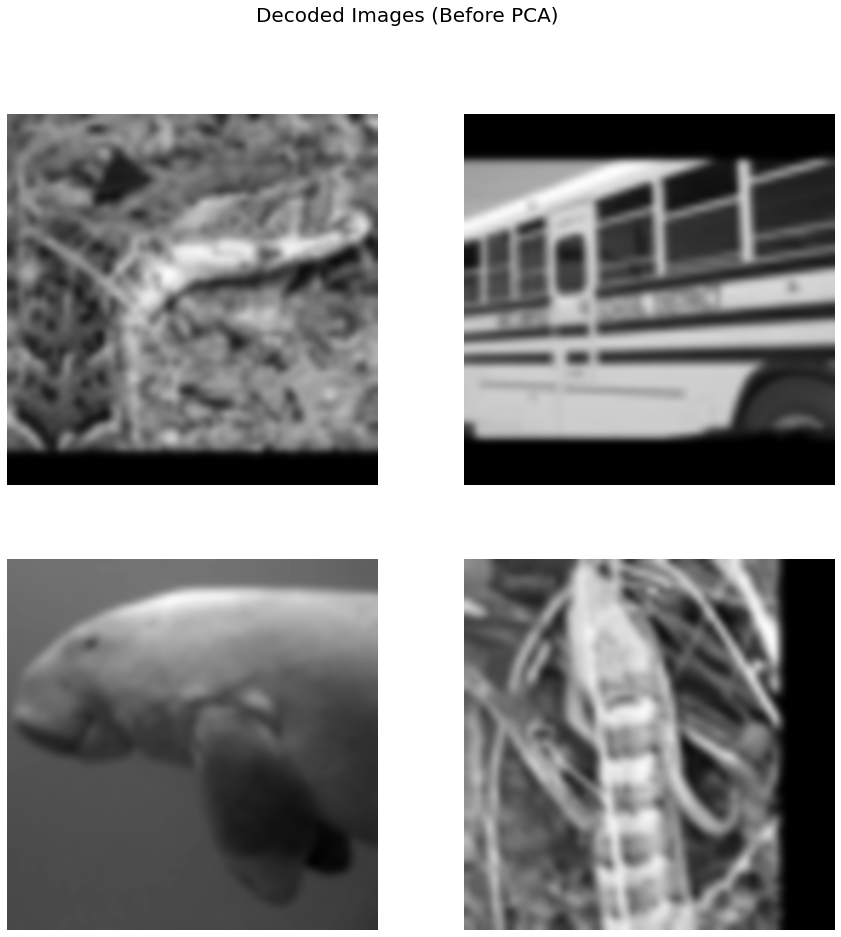

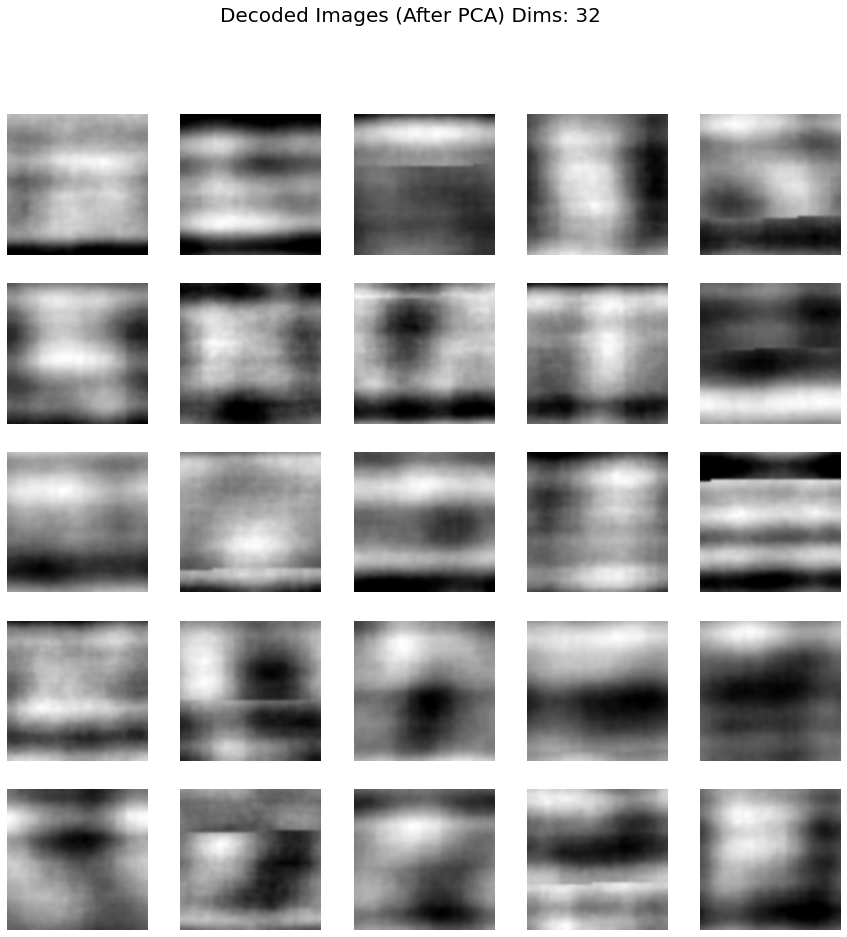

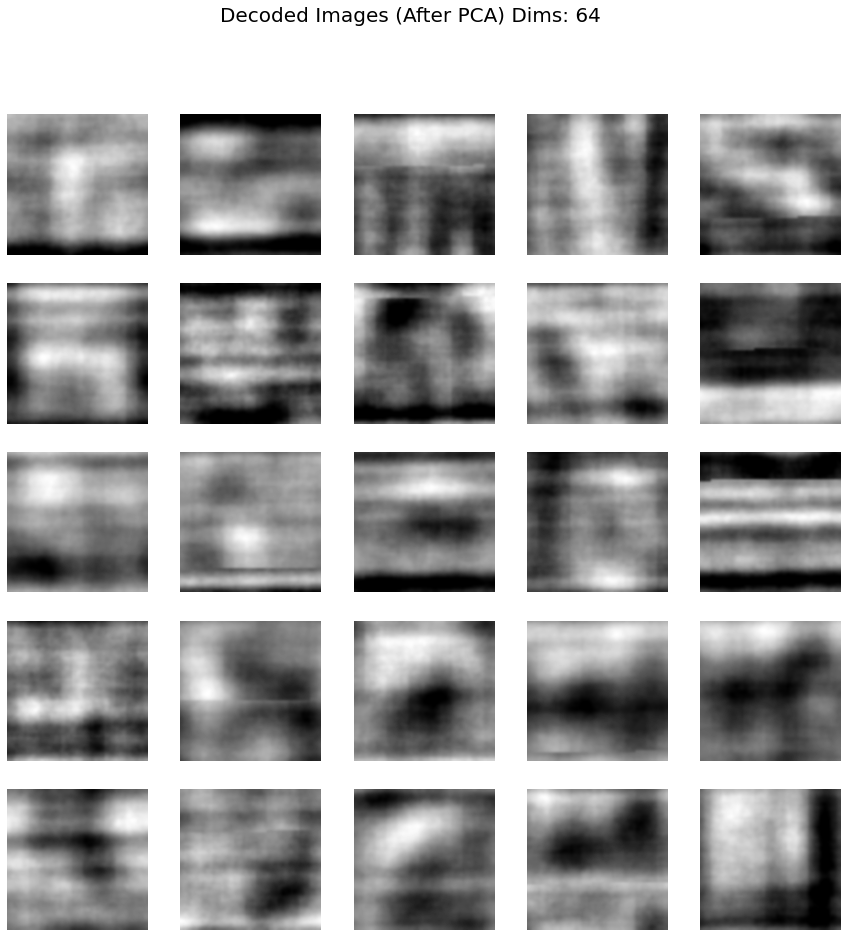

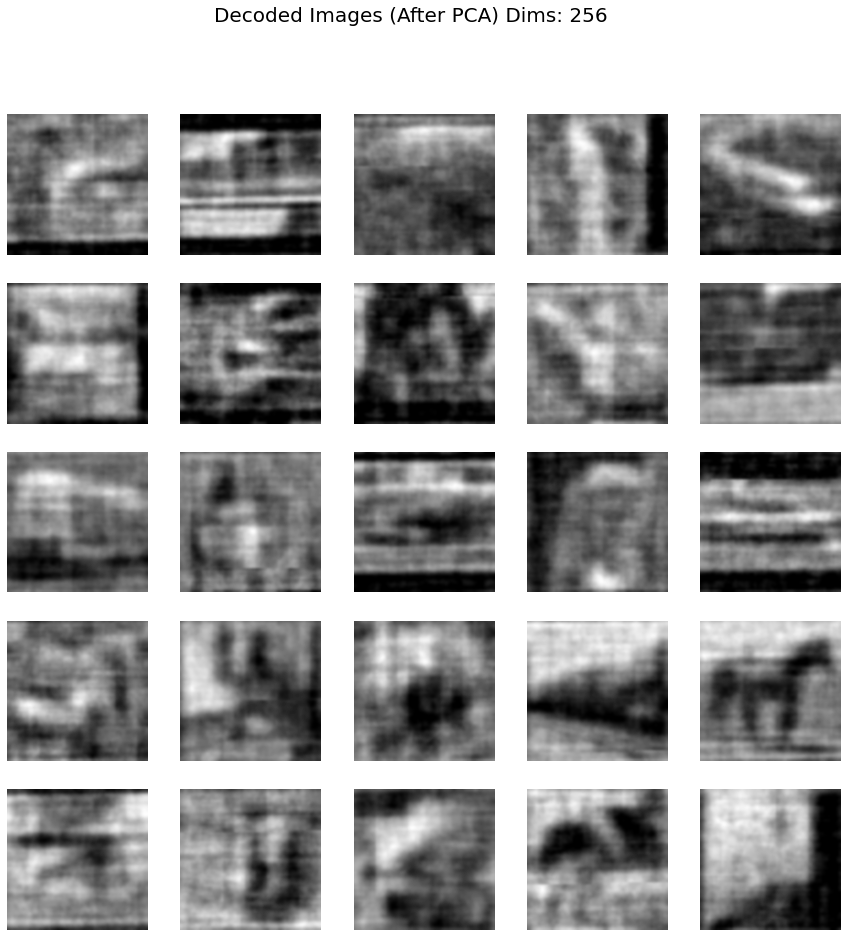

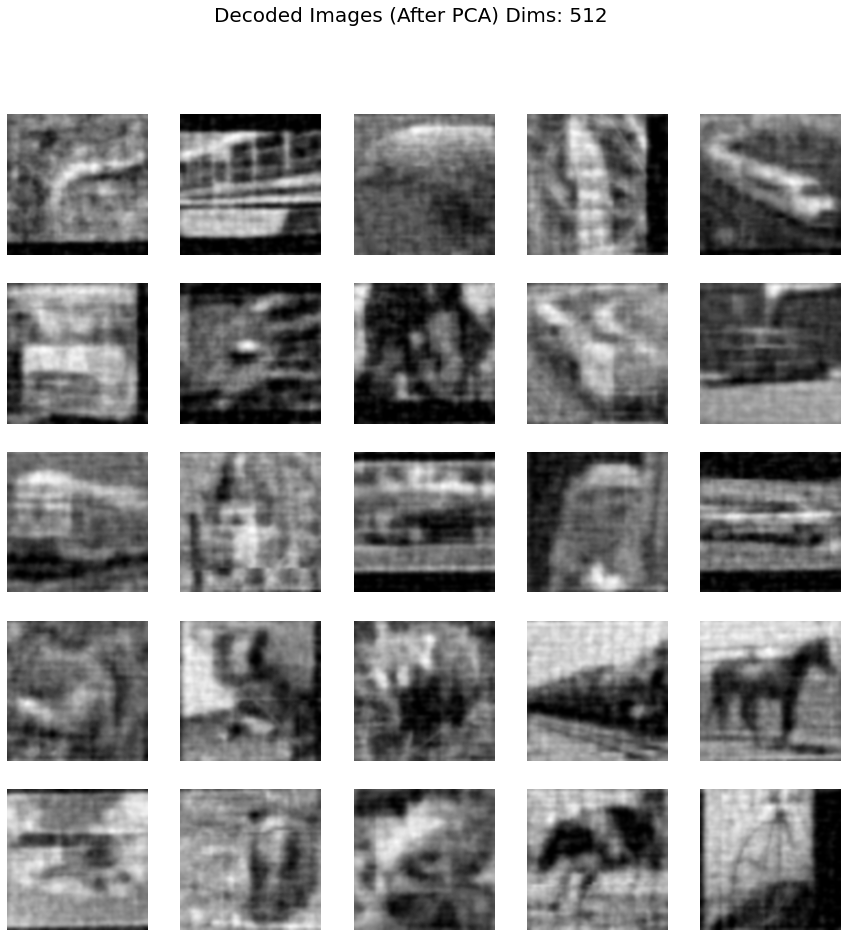

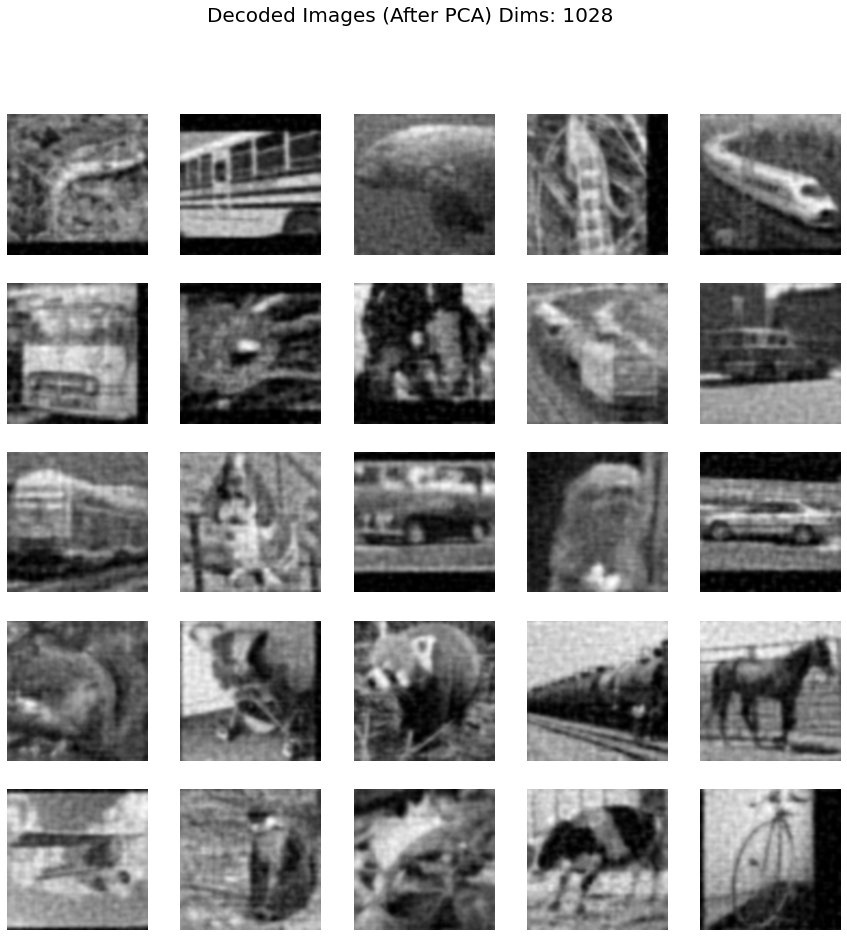

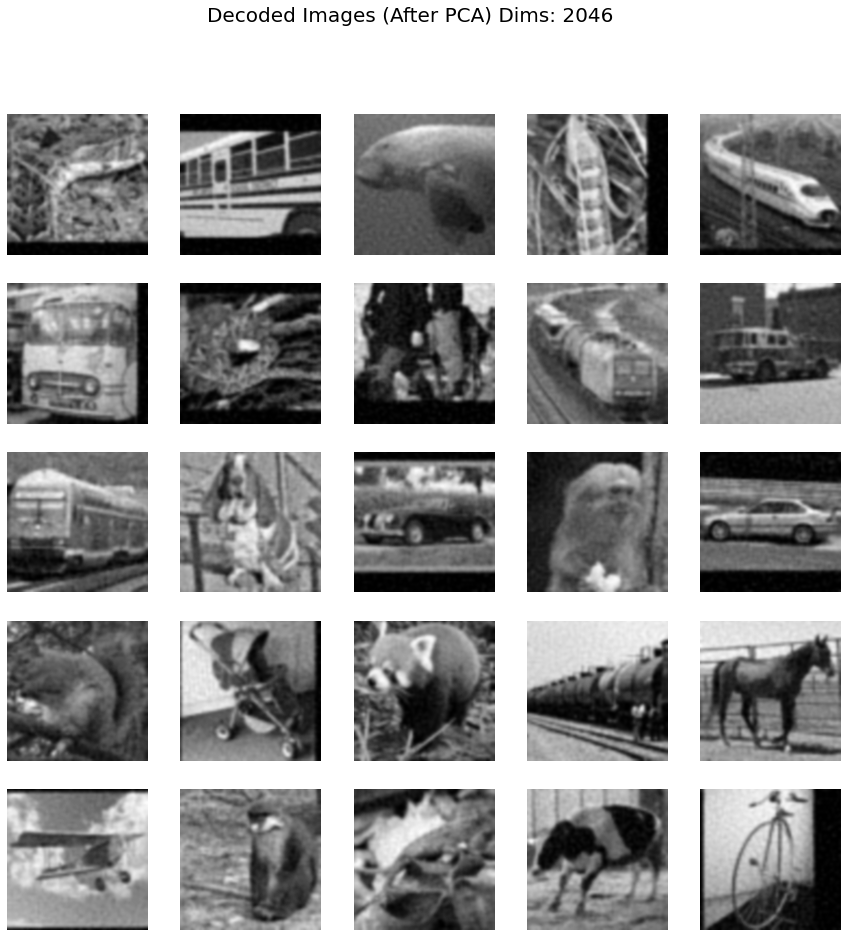

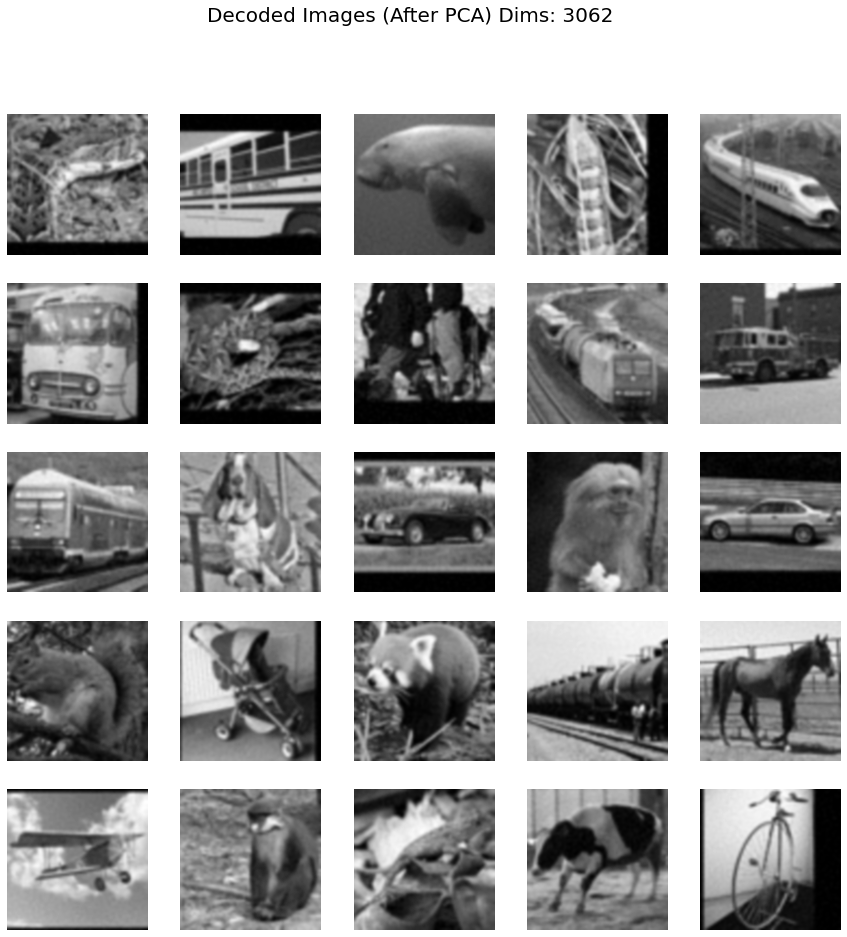

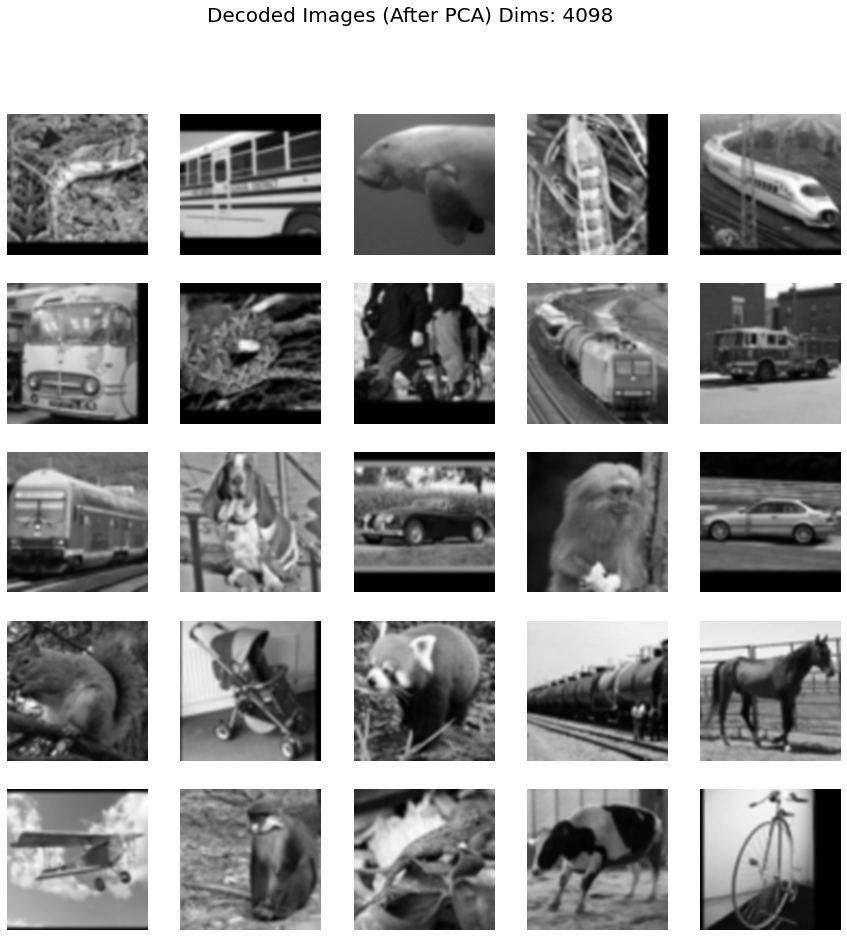

In [12]:
plot_images(pca_input_unlabeled,"Decoded Images (Before PCA)")
for h in range(len(dims)):
    plot_images(recon_images_list_u[h],"Decoded Images (After PCA) Dims: {}".format(dims[h]),n_images=25)

### Processing STL-10 Train Dataset

#### Train and Test Data Normalization

Since the train and test dataset will be used, to properly use the dataset for PCA and use the **UNLABELED** dataset z-code vectors for Test Dataset, both dataset needs to be normalized first.


In [13]:
def dataset_normalize(input_dataset,n_samples):
    print("===========================================================================================")
    #Mean Subtraction and Std Division
    #Preparing empty lists for storing data
    umean = 0.
    ustd = 0.
    normalize = True
    print("Starting Mean Subtraction (MS) and Std Division (SD) per channel...")
    channel_buf = np.float32(input_dataset)
    umean = np.mean(input_dataset)
    ustd = np.std(input_dataset)
    if normalize:
        #Normalization of a whole channel of a dataset
        #X = snd(channel_buf,mean,std,"Forward")
        
        #Using mean and std of unlabeled dataset
        X = snd(channel_buf,umean,ustd,"Forward")
        #Normalization of a channel of an image in a dataset
        # X = snd(channel_buf,mean,std,"Forward")
    else:
        X = channel_buf
        
    print("Initial Mean and Standard Deviation (Before Mean Subtraction and Std Division)")
    print("Mean: {}, Standard Dev.: {}".format(umean,ustd))
    print("Current Mean and Standard Deviation (After MS and SD)")
    print("Mean: {}, Standard Dev.: {}".format(np.mean(X),np.std(X)))
    print("===========================================================================================") 
    
    return X,umean,ustd

#### Processing Train Dataset

In [14]:
%%time
pre_processed_train,mean_train,std_train = dataset_normalize(pca_input_train,n_samples_train)
recon_images_list_train = []

for dim in dims:
    recon_images_train,principal_components_train,projected_train = pca_svd_inverse_transform(eig_vec,eig_val,covariance,mean_train,std_train,pre_processed_train,n_samples_train,dim,input_w,input_h)
    recon_images_list_train.append(recon_images_train)
    if dim == optimal_dim:
        optimal_z_code_train = projected_train.T
        optimal_principal_components_train = principal_components_train
        optimal_z_mean_train = mean_train
        optimal_z_std_train = std_train

Starting Mean Subtraction (MS) and Std Division (SD) per channel...
Initial Mean and Standard Deviation (Before Mean Subtraction and Std Division)
Mean: 0.4381525997911592, Standard Dev.: 0.24788690661695495
Current Mean and Standard Deviation (After MS and SD)
Mean: -1.631841684002211e-08, Standard Dev.: 0.9999999403953552
Starting low rank projection with dim = 32 ....
Output (Images Shapes) without MS and SD Reversal:
(5000, 65, 65)
Projected Z-code Shape:
(32, 5000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.4385746717453003, Standard Dev.: 0.022153006866574287
Starting low rank projection with dim = 64 ....
Output (Images Shapes) without MS and SD Reversal:
(5000, 65, 65)
Projected Z-code Shape:
(64, 5000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.4386552572250366, Standard Dev.: 0.030623219907283783
Starti

### Plotting of Images (TrainDataset)

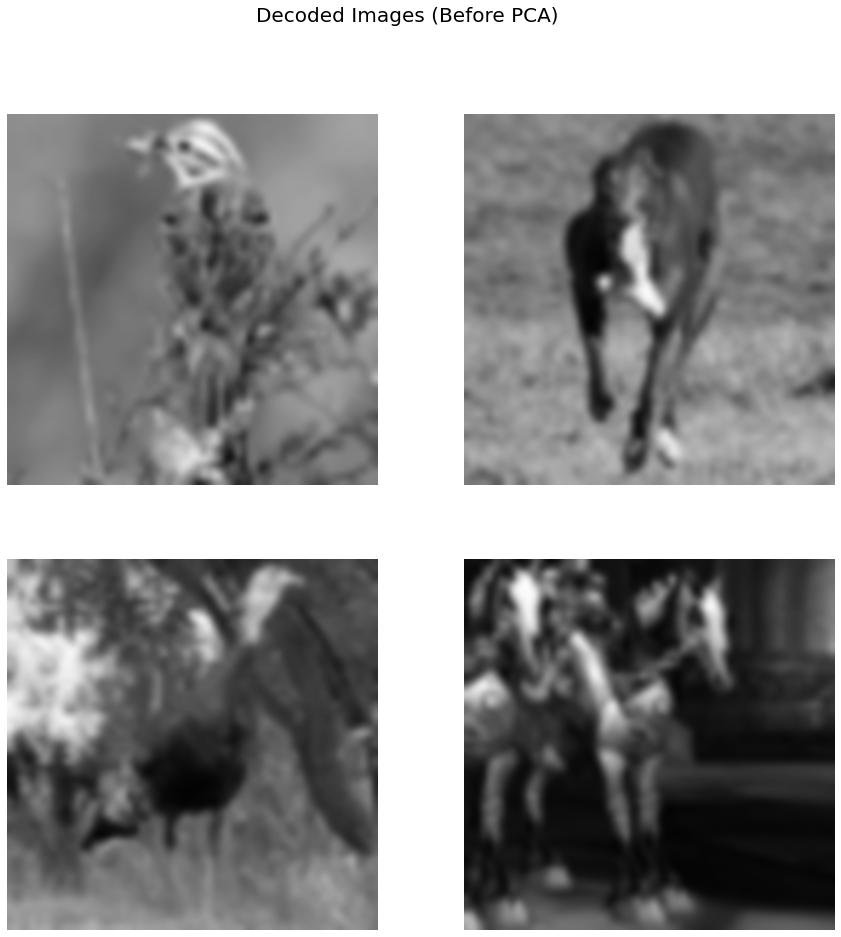

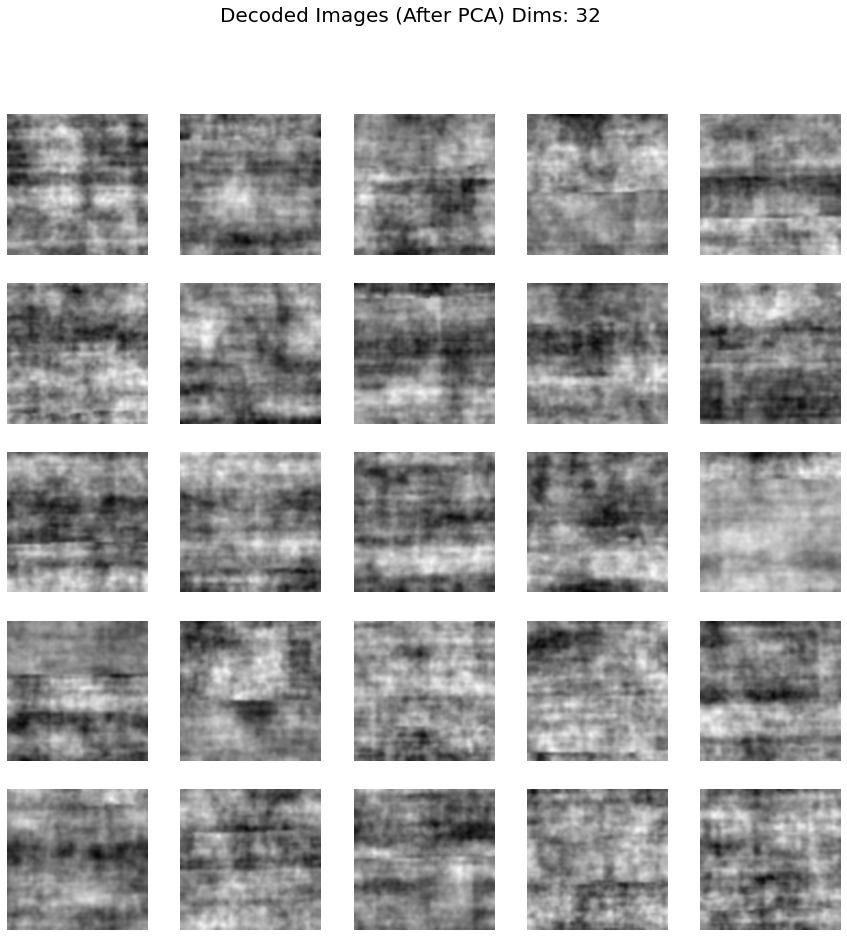

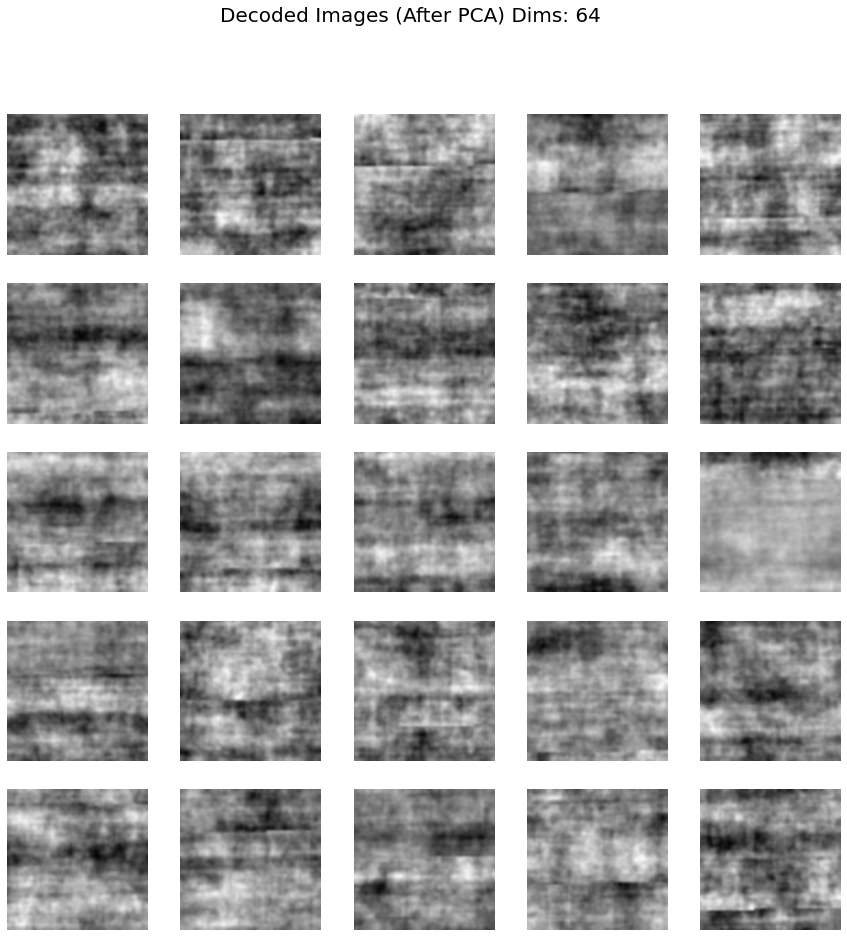

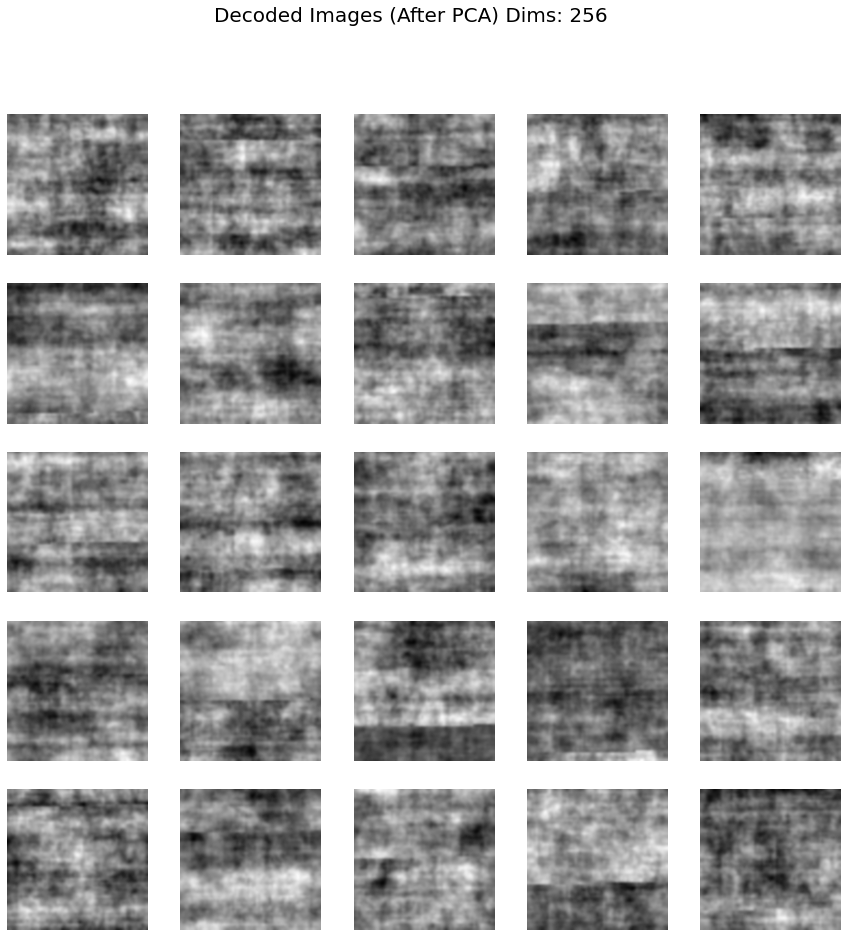

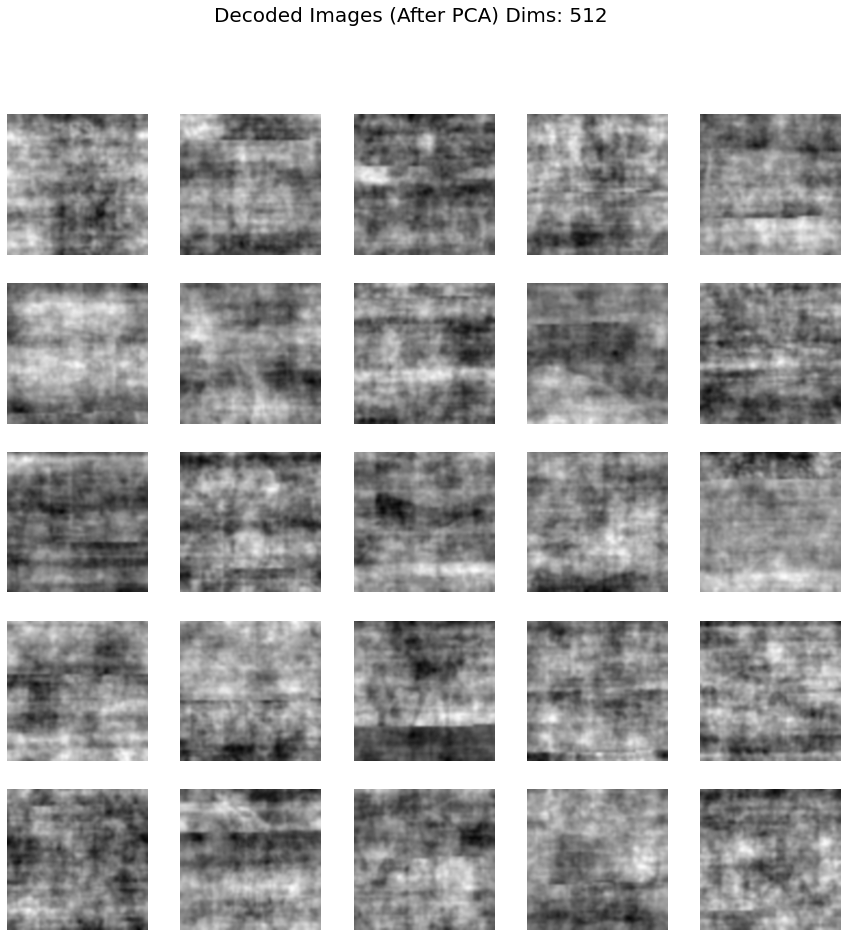

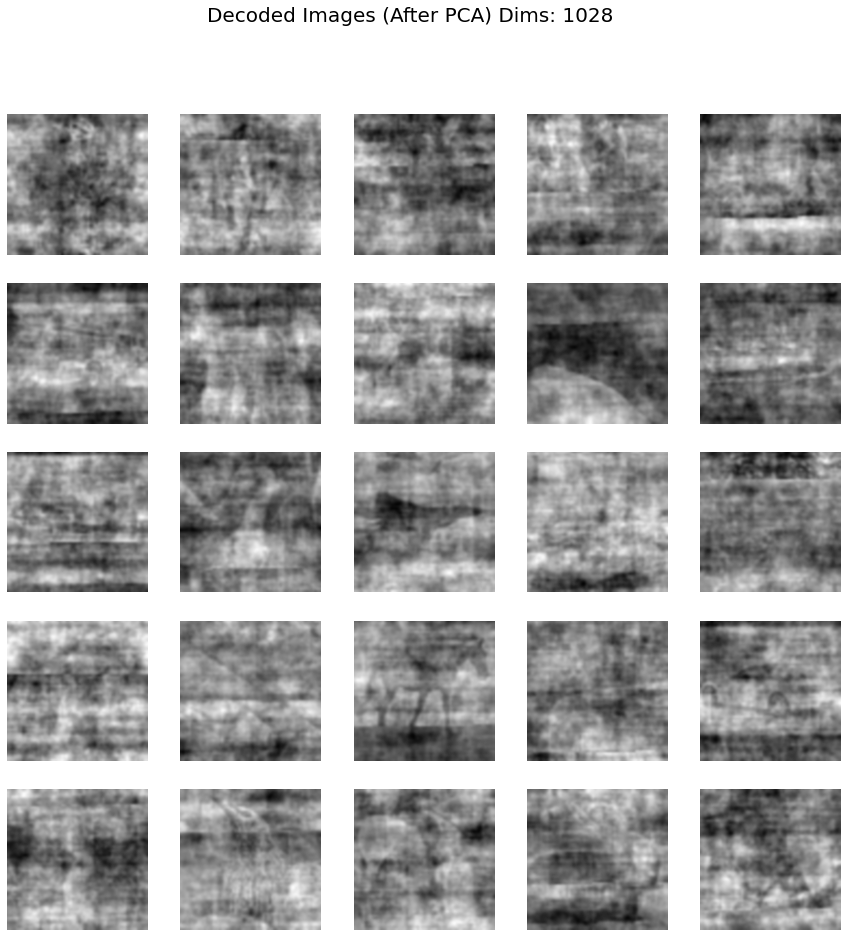

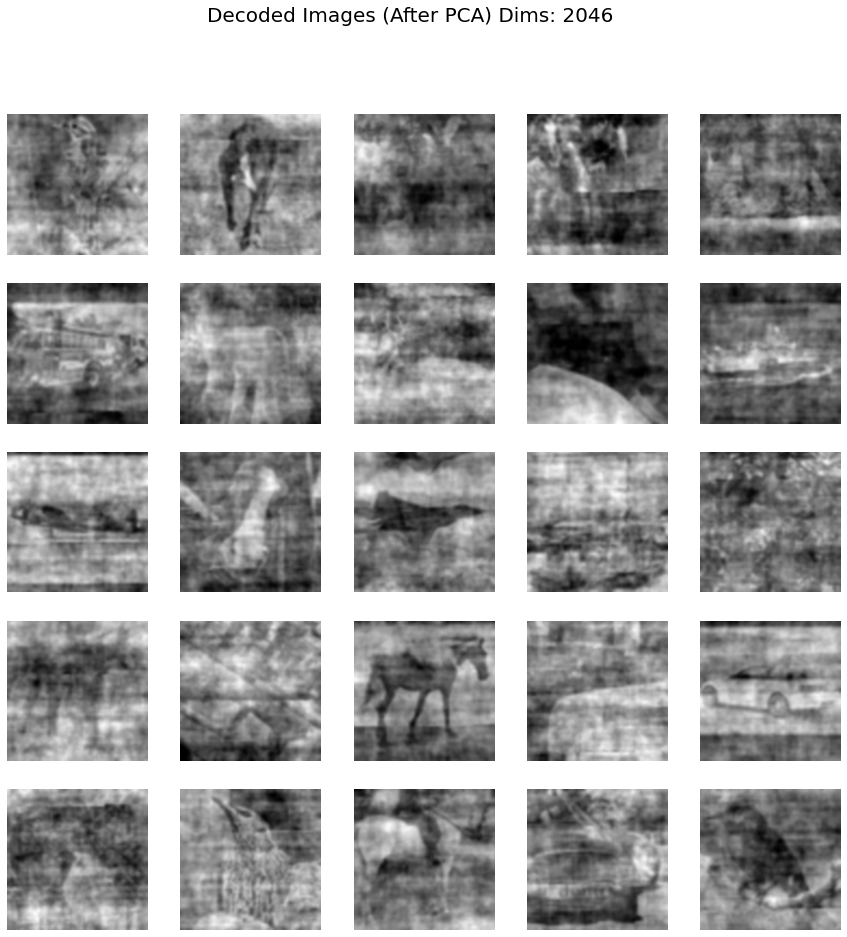

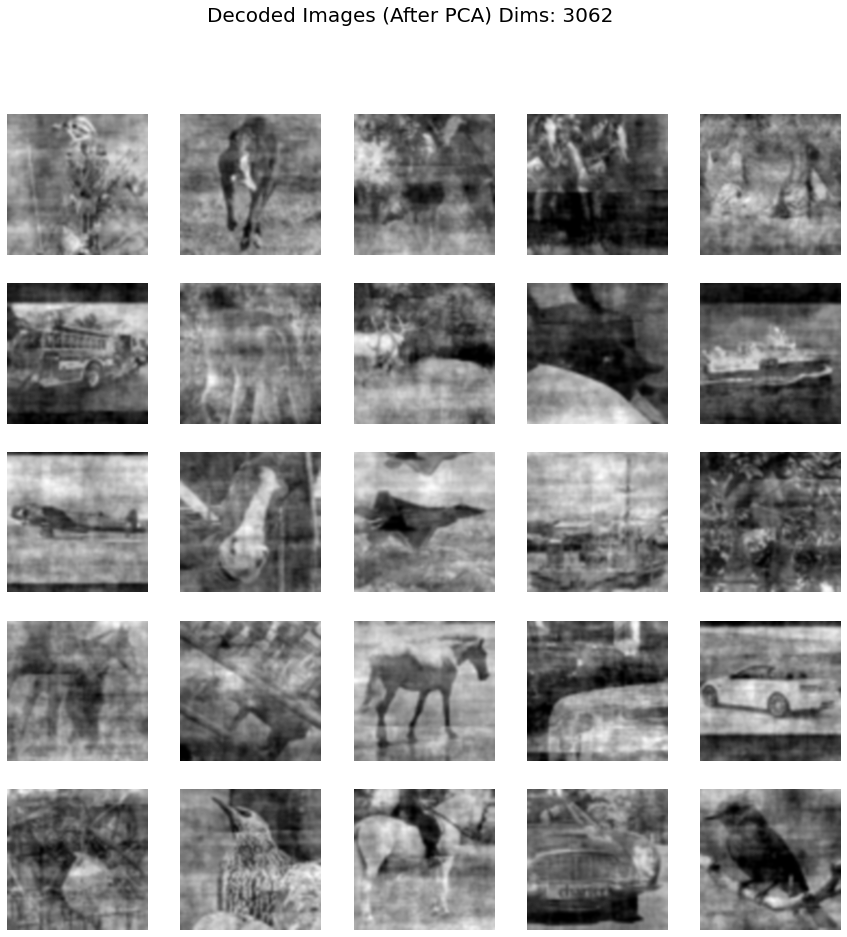

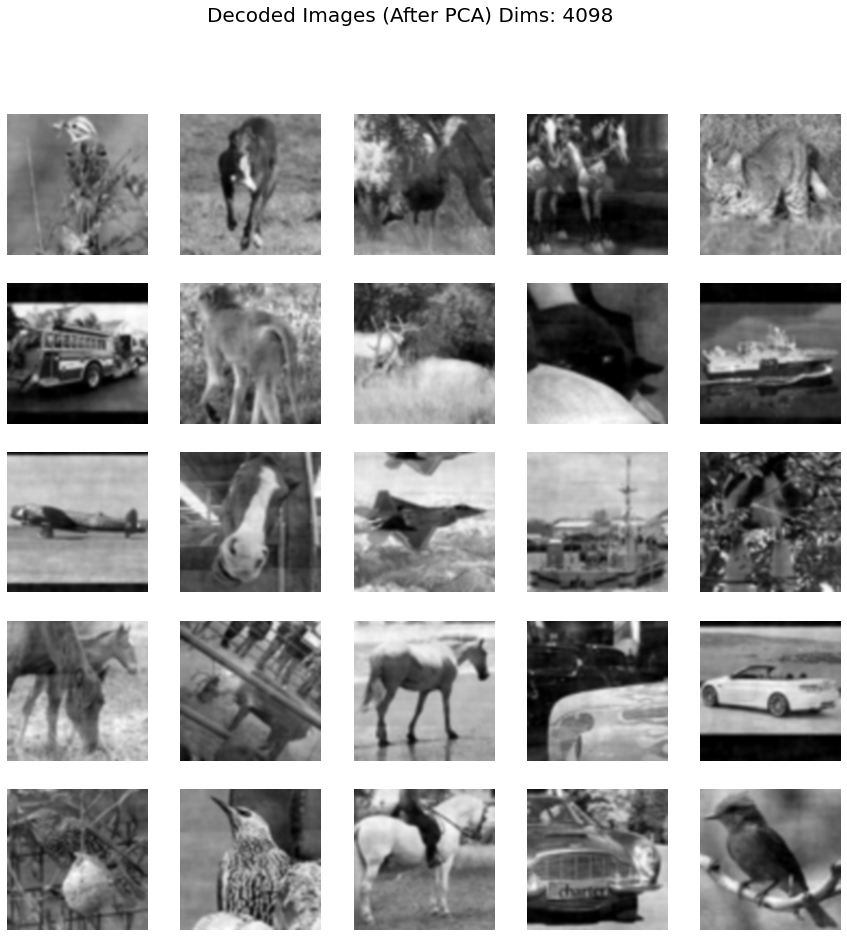

In [15]:
plot_images(pca_input_train,"Decoded Images (Before PCA)")
for h in range(len(dims)):
    plot_images(recon_images_list_train[h],"Decoded Images (After PCA) Dims: {}".format(dims[h]),n_images=25)

### Processing STL-10 Test Dataset


#### Post-processing STL-10 Test Dataset

In [16]:
%%time
pre_processed_test,mean_test,std_test = dataset_normalize(pca_input_test,n_samples_test)
recon_images_list_test = []

for dim in dims:
    recon_images_test,principal_components_test,projected_test = pca_svd_inverse_transform(eig_vec,eig_val,covariance,mean_test,std_test,pre_processed_test,n_samples_test,dim,input_w,input_h)
    recon_images_list_test.append(recon_images_test)
    if dim == optimal_dim:
        optimal_z_code_test = projected_test.T
        optimal_principal_components_test = principal_components_test
        optimal_z_mean_test = mean_test
        optimal_z_std_test = std_test

Starting Mean Subtraction (MS) and Std Division (SD) per channel...
Initial Mean and Standard Deviation (Before Mean Subtraction and Std Division)
Mean: 0.4380159791159067, Standard Dev.: 0.24768474640670024
Current Mean and Standard Deviation (After MS and SD)
Mean: 7.010014257957664e-08, Standard Dev.: 1.0
Starting low rank projection with dim = 32 ....
Output (Images Shapes) without MS and SD Reversal:
(8000, 65, 65)
Projected Z-code Shape:
(32, 8000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.4379880130290985, Standard Dev.: 0.0216939989477396
Starting low rank projection with dim = 64 ....
Output (Images Shapes) without MS and SD Reversal:
(8000, 65, 65)
Projected Z-code Shape:
(64, 8000)
Backprojecting the Approximated Images (MS and SD Reversal)
Current Mean and Standard Deviation (After MS and SD Reversal)
Mean: 0.43793314695358276, Standard Dev.: 0.03070521168410778
Starting low rank projec

### Plotting of Images (Test Dataset)

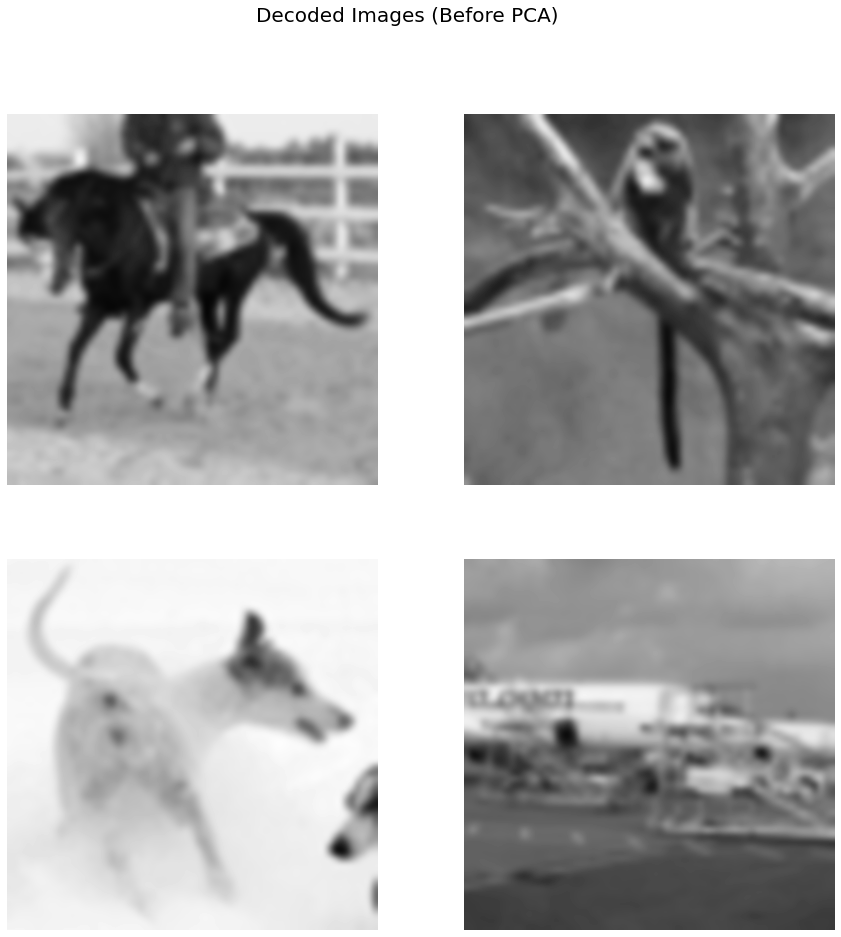

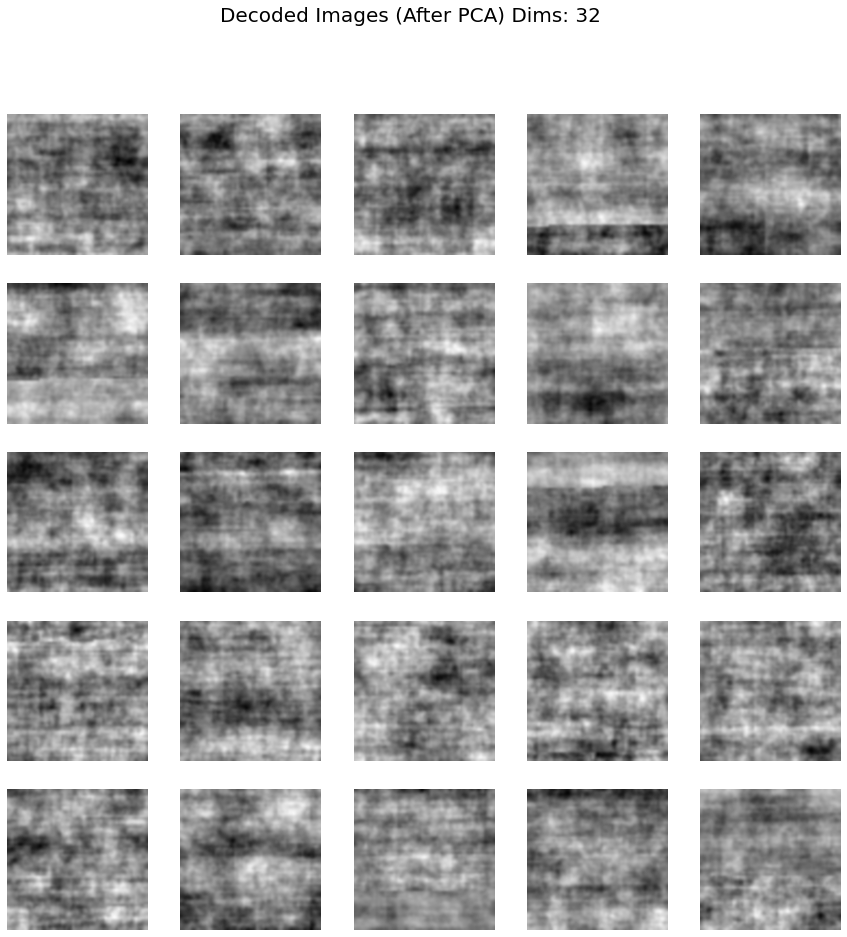

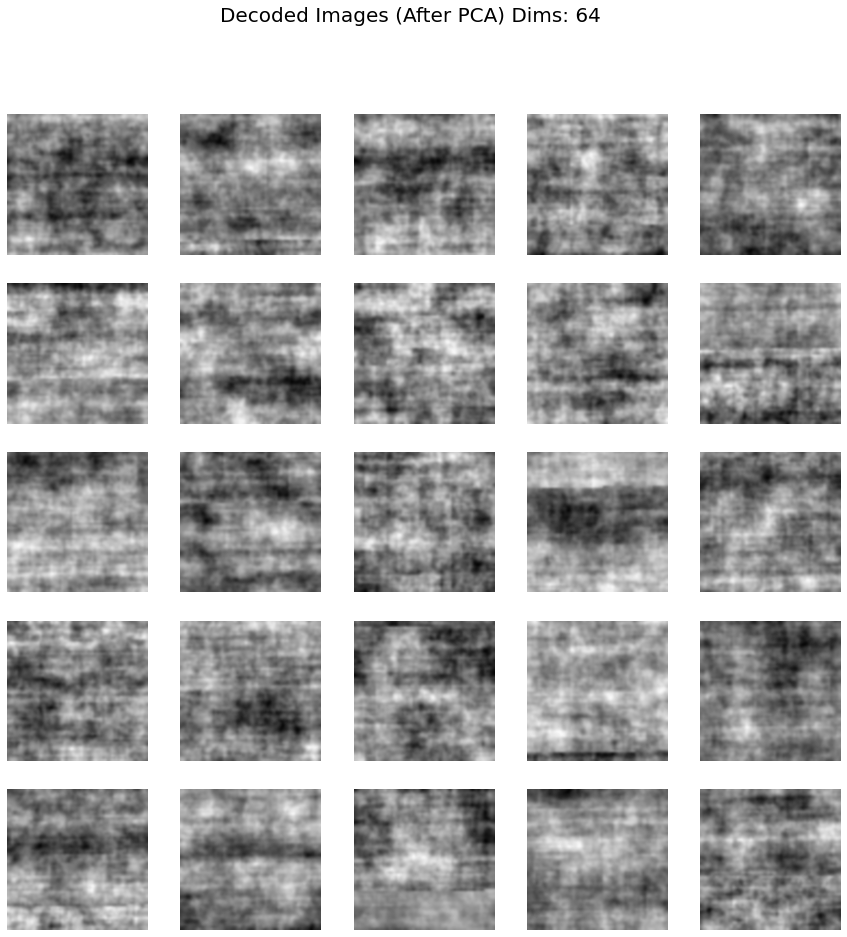

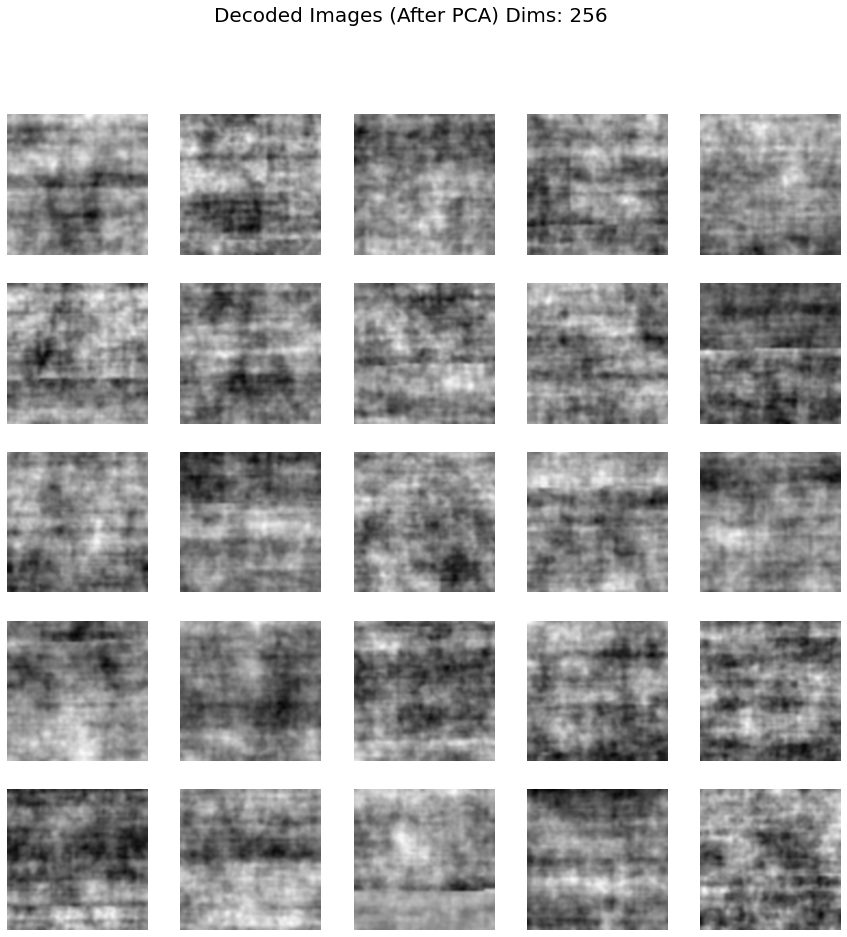

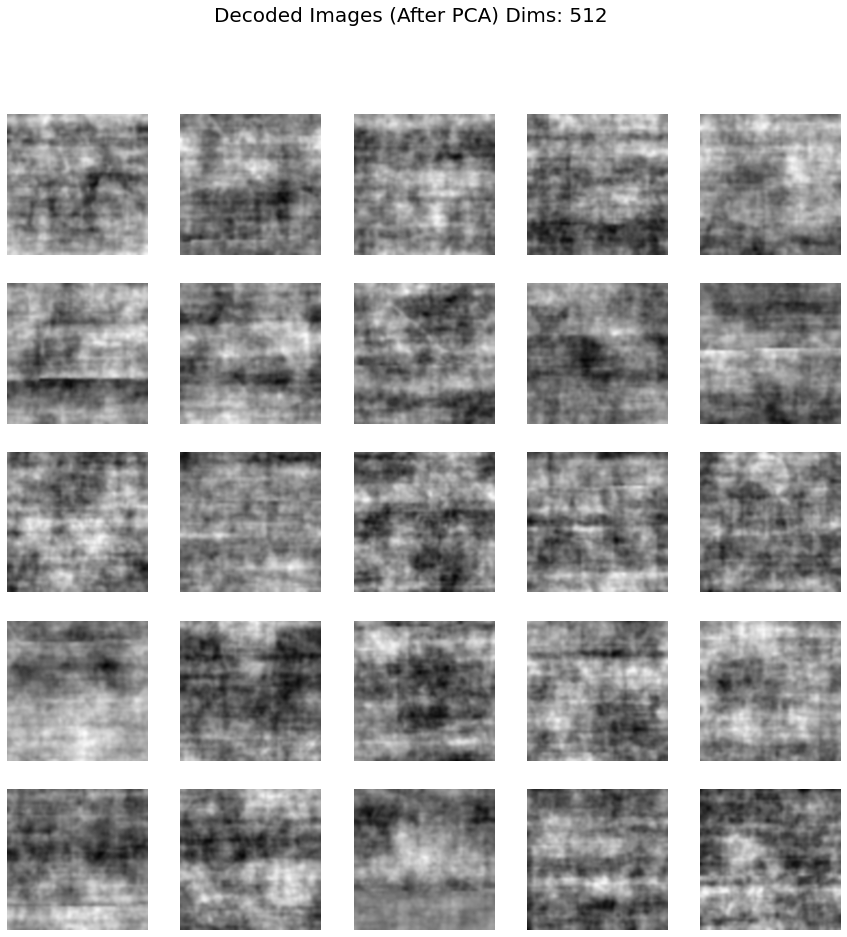

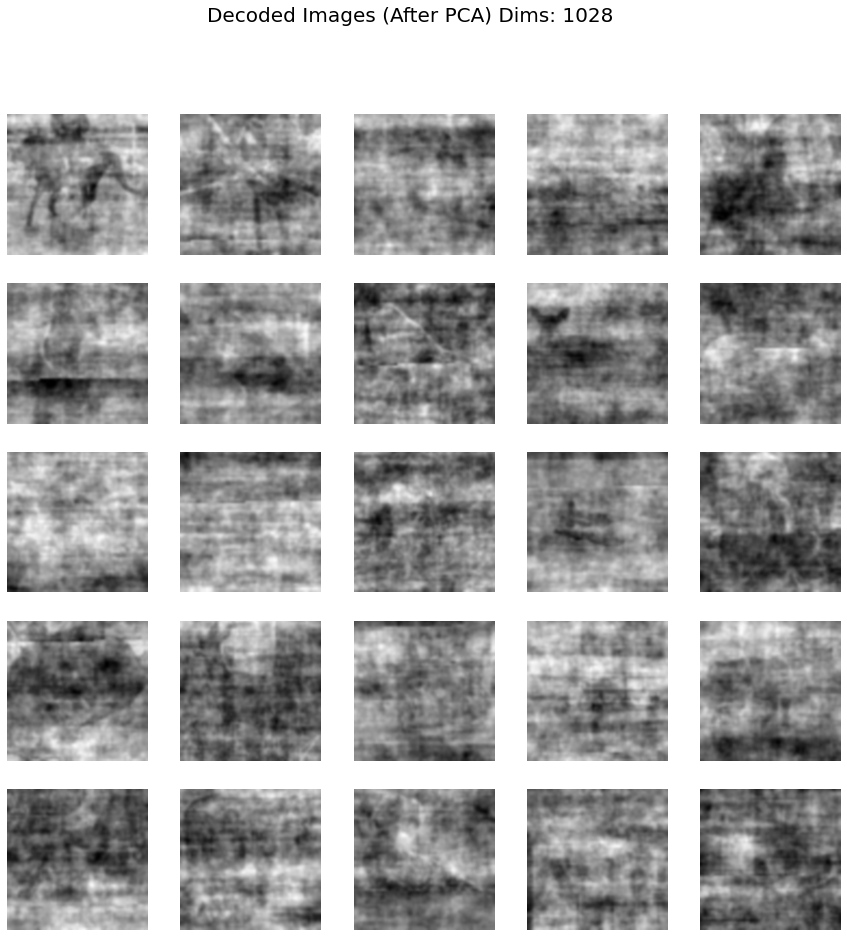

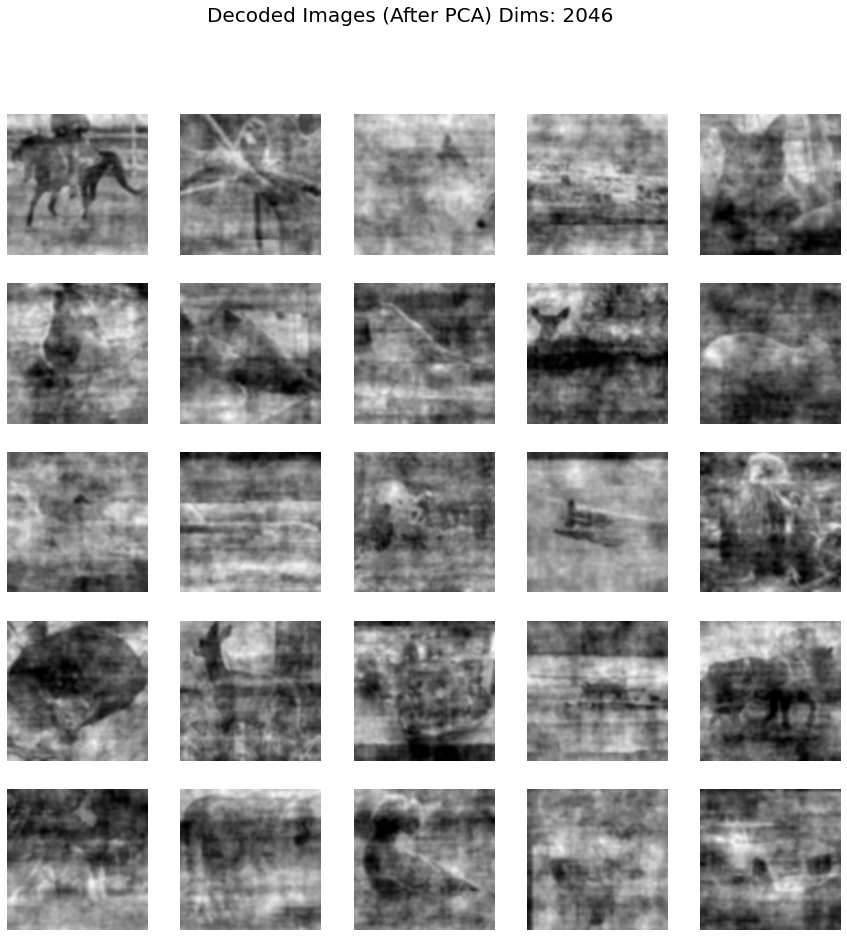

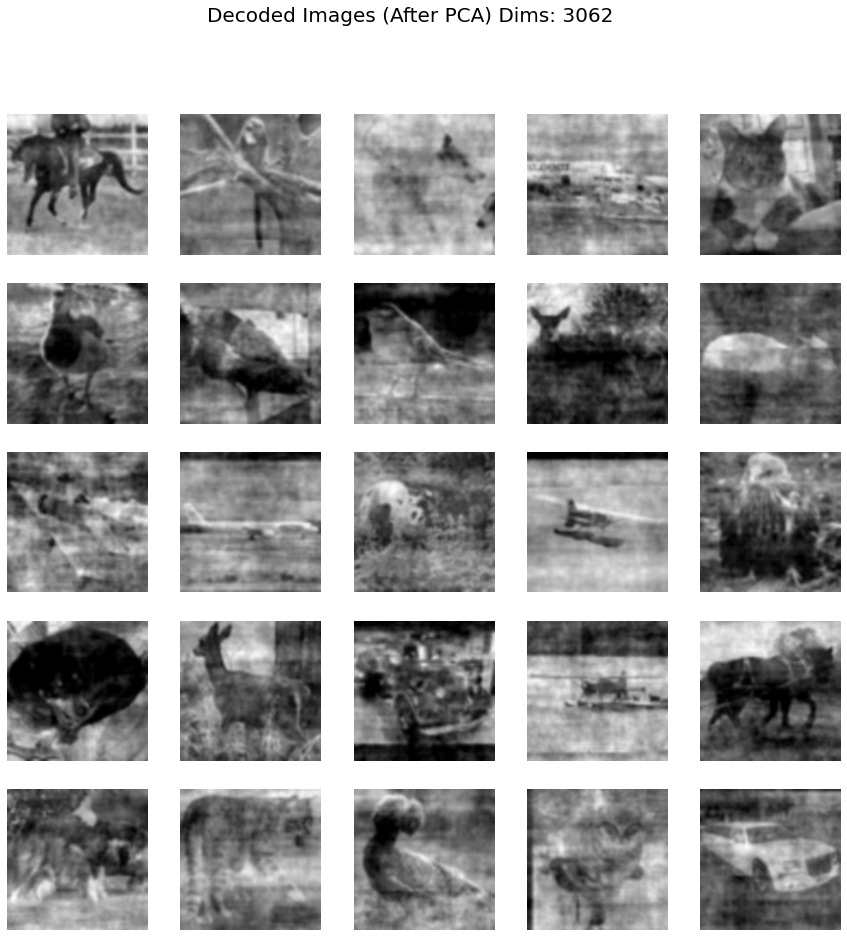

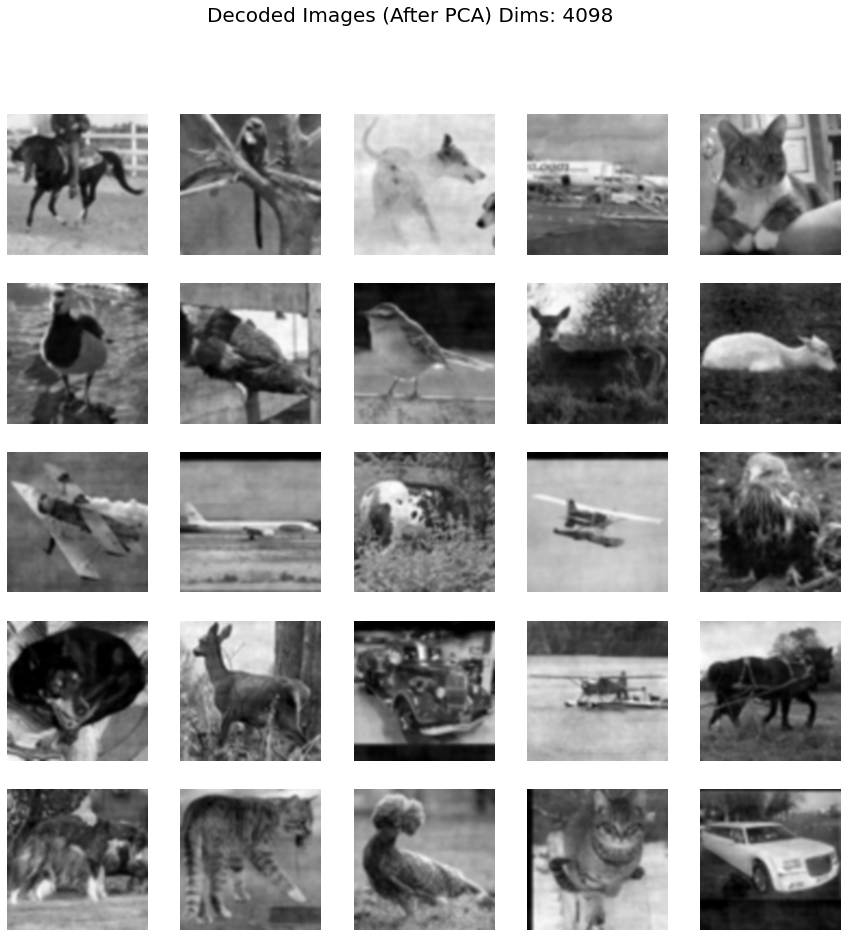

In [17]:
plot_images(pca_input_test,"Decoded Images (Before PCA)")
for h in range(len(dims)):
    plot_images(recon_images_list_test[h],"Decoded Images (After PCA) Dims: {}".format(dims[h]),n_images=25)

### Calculating the MSE for each dataset

#### Mean Squared Error

The loss function that will be used in this notebook is Mean Squared Error (MSE). This will be used to verify how much loss is present in the decoded images (referenced from the original input images). Each channel's MSE is calculated and the total MSE for the image is the sum of each channel's MSE. This is based on this [reference](https://github.com/chia56028/PSNR-Calculator-for-Images)

**MSE for each color channel (R,G,B)**
$$MSE_{CHANNEL}\,=\, \frac{1}{n}\sum_{j=1}^{m}\sum_{i=1}^{n} (y_{i,j}-\hat{y_{i,j}})^{2}$$

**Total MSE**
$$ MSE_{TOTAL}\,=\,MSE_{R}\,+\,MSE_{G}\,+\,MSE_{B}$$

**MSE for grayscale images**
$$MSE_{GRAYSCALE}\,=\, \frac{1}{n}\sum_{j=1}^{m}\sum_{i=1}^{n} (y_{i,j}-\hat{y_{i,j}})^{2}$$

Since the dataset is changed to grayscale images, the MSE used will be for grayscale images.

In [18]:
from sklearn.metrics import mean_squared_error
#Loss Function will be based on the Mean Squared Error and the arguments are the Acurr (predictions) and output (Y from X,Y)
def mse(prediction,data_output):
    diff_squared = np.power(np.subtract(data_output,prediction),2)
    #sum_of_all = diff_squared.sum() 
    #print("sum_of_all: {}".format(sum_of_all))
    #loss = (sum_of_all)/data_output.size
    loss = np.mean(diff_squared)
    return loss
#Using np.mean() increases the MSE while not using np.mean() gives unpredictable trend

def mse_eval(approximation,input_set,dims,n_samples):
    mse_vals = []
    for dim in range(len(dims)):
        #Using built function
        mse_val = mse(approximation[dim],input_set)
        mse_vals.append(mse_val)
       
        print("Finished dim: {}".format(dims[dim]))
    return mse_vals

def plot_mse(mse_vals,dims,title):
    plt.figure(figsize=[15,5])
    plt.plot(dims,mse_vals,marker="o",label = "MSE Values")
    plt.grid(b=True,which="both",axis="both")
    plt.xlim(min(dims)-100, max(dims)+100)
    plt.xlabel('Dimensions')
    plt.ylabel('Error (MSE)')
    plt.legend()
    plt.title(title)
    plt.show()

#### MSE Evaluation (Unlabeled Dataset)
In this part, each color channel's MSE is computed and saved in separate lists for plotting.

In [19]:
%%time 
u_mse = mse_eval(recon_images_list_u,pca_input_unlabeled,dims,n_samples_unlabeled)

Finished dim: 32
Finished dim: 64
Finished dim: 256
Finished dim: 512
Finished dim: 1028
Finished dim: 2046
Finished dim: 3062
Finished dim: 4098
Wall time: 22.5 s


#### Plotting of MSE vs z-dim (Unlabeled Dataset)

Based on the plot, the dimensions 1028 and 2046 are the optimal dimensions for the unlabel dataset. Since the difference of MSE between dimensions 1028 and 2046 is low compared to others, I think that the optimal z-dim for the unlabeled dataset is the **1028 dimesions**.

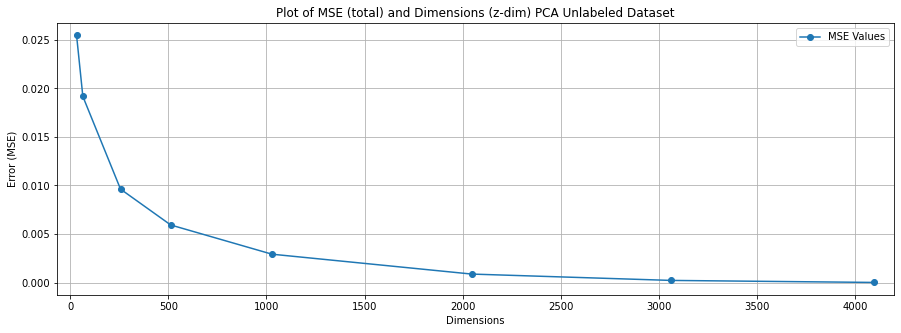

In [20]:
#Plot of the Whole Dataset (Unlabeled)
plot_mse(u_mse,dims,'Plot of MSE (total) and Dimensions (z-dim) PCA Unlabeled Dataset')

#### MSE Evaluation (Train Dataset)
In this part, the MSE is computed and saved in separate lists for plotting.

In [21]:
%%time 
train_mse = mse_eval(recon_images_list_train,pca_input_train,dims,n_samples_train)

Finished dim: 32
Finished dim: 64
Finished dim: 256
Finished dim: 512
Finished dim: 1028
Finished dim: 2046
Finished dim: 3062
Finished dim: 4098
Wall time: 9.37 s


#### Plotting of MSE vs z-dim (Train Dataset)

Based on the plot, dimensions 1028 and 2046 provide the best reconstruction quality and lowest MSE for the test dataset. Since the difference of MSE between dimensions 1028 and 2046 is low compared to others, I think that the optimal z-dim for the test dataset is the **1028 dimesions**.

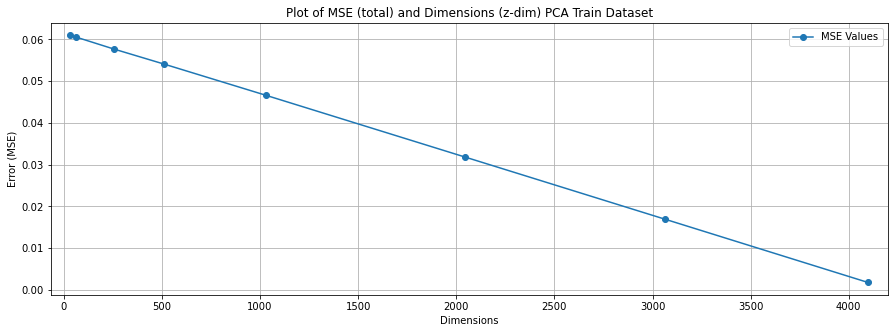

In [22]:
#Plot of the Whole Dataset (Train)
plot_mse(train_mse,dims,'Plot of MSE (total) and Dimensions (z-dim) PCA Train Dataset')


#### MSE Evaluation (Test Dataset)
In this part, the MSE is computed and saved in separate lists for plotting.

In [23]:
%%time 
test_mse = mse_eval(recon_images_list_test,pca_input_test,dims,n_samples_test)

Finished dim: 32
Finished dim: 64
Finished dim: 256
Finished dim: 512
Finished dim: 1028
Finished dim: 2046
Finished dim: 3062
Finished dim: 4098
Wall time: 15.1 s


#### Plotting of MSE vs z-dim (Test Dataset)

Based on the plot, dimensions 1028 and 2046 provide the best reconstruction quality and lowest MSE for the test dataset. Since the difference of MSE between dimensions 1028 and 2046 is low compared to others, I think that the optimal z-dim for the test dataset is the **1028 dimesions**.

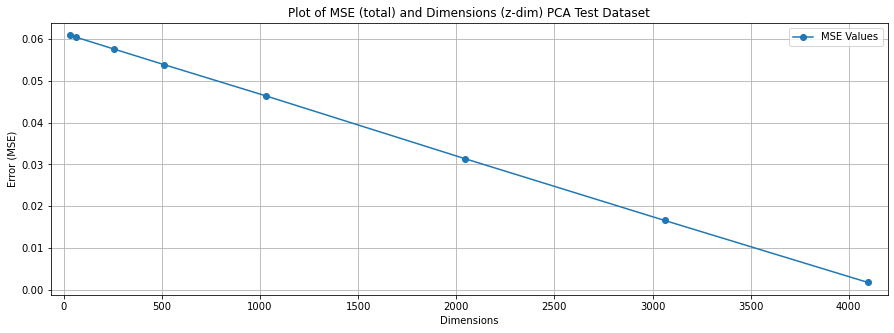

In [24]:
#Plot of the Whole Dataset (Test)
plot_mse(test_mse,dims,'Plot of MSE (total) and Dimensions (z-dim) PCA Test Dataset')

## Part 2: Using the "optimal" z-dim in PCA
Can we fit a 10-component GMM on the unlabeled dataset 𝒛 code vectors from PCA? 

Can we use the GMM and labeled train set to assign labels to the 10 clusters in GMM?

Report the accuracy on the test dataset.

Can we build an STL generative model using unlabeled dataset  PCA 𝒛 code vectors and GMM? 


#### Converting Sampled GMM points  using Sci-kit

Using the projected z-code from the PCA, GMM will be used to cluster the images. This is an example to check if my results (based also on this GMM class) is similar

In [25]:
%%time
from matplotlib.colors import LogNorm
from sklearn import mixture

input_gmm = optimal_z_code_u
#input_gmm = optimal_z_code_train
print("Starting a new GMM model...")
print("Using input shape: {}".format(input_gmm.shape))
model_gmm = mixture.GaussianMixture(n_components=10, covariance_type='full')
model_gmm.fit(input_gmm)
print("Finished fitting the input data. Getting cluster labels...")

    
#image_mixed = gmm_convert(sample_list,optimal_p_components,optimal_z_mean,optimal_z_std,dim=1028,n_samples=10000)

Starting a new GMM model...
Using input shape: (10000, 2046)
Finished fitting the input data. Getting cluster labels...
Wall time: 1min 27s


#### Predicting Cluster Labels by using GMM model

In this part, the fitted GMM model (from the unlabeled z code) is used to classify the images on the different datasets. The train and test z code (projected points) are used as input for the predict().

In [26]:
label_train_prediction = model_gmm.predict(optimal_z_code_train)
print("Finished predicting train labels...")
label_test_prediction = model_gmm.predict(optimal_z_code_test)
print("Finished predicting test labels...")

Finished predicting train labels...
Finished predicting test labels...


#### Processing Labels
In this part, the labels (prediction) will be compared to the true labels of the train dataset (truth).

In [27]:
def process_labels(train_labels,cluster_names,train_labels_pred):
    cluster_index = {}
    train_pred_index = {}
    train_pred = {}
    train_truth_index = {}
    train_truth = {}
    names = ['airplane','bird','car','cat','deer','dog','horse','monkey','ship','truck']
    
    #loop for each image
    for index in range(5000): 
        #loop for each cluster
        for name in names:
            #print("Name: {}".format(name))
            if train_labels[index] == cluster_names[name]:
                if name in train_truth_index.keys():
                    train_truth_index[name].append(index)
                else:
                    train_truth_index[name] = [index]
                    
                if name in train_truth.keys():
                    
                    train_truth[name] = train_truth[name] + 1
                else:
                    train_truth[name] = 1
                    
    for index in range(5000):
        for name in names:
          #print("Name: {}".format(name))
            if train_labels_pred[index] == cluster_names[name]:
                if name in train_pred_index.keys():
                    train_pred_index[name].append(index)
                else:
                    train_pred_index[name] = [index]
                    
                if name in train_pred.keys():
                    
                    train_pred[name] = train_pred[name] + 1
                else:
                    train_pred[name] = 1

    print("pred: {}".format(train_pred))
    print("truth: {}".format(train_truth))
    return train_truth_index,train_truth,train_pred_index,train_pred



#### Results of Prediction

In [28]:
print("Train Dataset")
train_truth_index,train_truth,train_pred_index,train_pred = process_labels(train_labels,cluster_names,label_train_prediction)
print("Test Dataset")
test_truth_index,test_truth,test_pred_index,test_pred = process_labels(test_labels,cluster_names,label_test_prediction)

Train Dataset
pred: {'airplane': 4762, 'cat': 230}
truth: {'bird': 500, 'dog': 500, 'horse': 500, 'cat': 500, 'truck': 500, 'monkey': 500, 'deer': 500, 'ship': 500, 'airplane': 500, 'car': 500}
Test Dataset
pred: {'airplane': 4556, 'cat': 444}
truth: {'horse': 513, 'monkey': 505, 'dog': 483, 'airplane': 500, 'cat': 529, 'bird': 507, 'deer': 491, 'truck': 485, 'car': 484, 'ship': 503}


#### Getting images classified based on the indices


In [29]:
import math
#Initializing Dictionaries
train_im_percluster_truth = {}
train_im_percluster_pred = {}
test_im_percluster_pred = {}
test_im_percluster_truth = {}

names = ['airplane','bird','car','cat','deer','dog','horse','monkey','ship','truck']

for name in names:
    #For Train Dataset
    #Getting list of images per cluster (Truth)
    train_im_percluster_truth[name] = train[train_truth_index[name]]
    #Getting list of images per cluster (Pred)
    if name in train_pred_index.keys():
        train_im_percluster_pred[name] = train[train_pred_index[name]]
        
    #For Test Dataset
    #Getting list of images per cluster (Truth)
    test_im_percluster_truth[name] = test[test_truth_index[name]]
    #Getting list of images per cluster (Pred)
    if name in test_pred_index.keys():
        test_im_percluster_pred[name] = train[test_pred_index[name]]
        
print("Train Truth Clusters: {}".format(train_im_percluster_truth.keys()))
print("Train Pred Clusters: {}".format(train_im_percluster_pred.keys()))
print("Test Truth Clusters: {}".format(test_im_percluster_truth.keys()))
print("Test Pred Clusters: {}".format(test_im_percluster_pred.keys()))

Train Truth Clusters: dict_keys(['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'])
Train Pred Clusters: dict_keys(['airplane', 'cat'])
Test Truth Clusters: dict_keys(['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'])
Test Pred Clusters: dict_keys(['airplane', 'cat'])


#### Checking accuracy of the predicted test dataset

In this part, I plan to check the accuracy of GMM classifier on the Test dataset by comparing each image in the list, if there is a match, a point will be added and accumulate. The total points will then be divided by the total number of images per cluster (on the true labels) and converted to percentage. So the formula will be:

\begin{equation*}
    Accuracy_{cluster}\,=\,\frac{number\,of\,image\,matches}{\,number\,of\,images\,per\,cluster}\,\times\,100
\end{equation*}

The overall accuracy can also be computed by dividing the total number of matches (in all clusters) over the total number of samples then converted to percentage.

**Note**: The assumption in this part is that the cluster labels of the truth and prediction lists are matched (meaning truth label 0 == pred_label 0) and I know that this is not necessarily the case. However, since I have no idea on how to properly match it, I think this method (with the assumptions) are good enough to demonstrate how badly the GMM classifier is in classifying the train and test dataset

In [30]:
def accuracy_test(dict_truth,dict_pred,names):
    #Iterate through the clusters
    accuracy = []
    for name in names:
        #Iterate through each row(samples) in list of images
        matches =0 #reset counter
        if name in dict_pred.keys():
            print("Currently matching images in cluster: {}".format(name))
            #Convert to 2D
            dict_truth[name] = dict_truth[name].reshape((len(dict_truth[name]),-1))
            dict_pred[name] = dict_pred[name].reshape((len(dict_pred[name]),-1))
            print("Truth Shape: {}, Pred Shape: {}".format(dict_truth[name].shape,dict_pred[name].shape))
            j=0
            verbose =True
            for i in dict_truth[name]:
                if i.tolist() in dict_pred[name].tolist():#If there is a match
                    if verbose and j%100 == 0:
                        print("Loop: {}, Matches: {}".format(j,matches))
                    matches += 1
                j+=1
            acc_percluster = (matches / dict_truth[name].shape[0]) * 100.
            print("Accuracy for cluster {}: {}".format(name,acc_percluster))
            accuracy.append(acc_percluster)
        else:
            accuracy.append(0)
    return accuracy

#Using this so that I only need to compare the indices of the image not the actual images itself for faster execution time
def accuracy_test_quicker(truth_index,pred_index,names):
    acc_list = []
    for name in names:
        if name in pred_index.keys():
            print("Currently in cluster: {}....".format(name))
            match = 0
            for i in pred_index[name]:
                for j in truth_index[name]:
                    if i==j:
                        if i%100 == 0:
                            print("Loop: {}, Matches: {}".format(i,match))
                        match += 1
            accuracy = (match/len(truth_index[name])) *100.
            acc_list.append(accuracy)
        else:
            acc_list.append(0)
    return acc_list

def accuracy_test_all(truth,pred): #Overall accuracy (Quicker than accuracy per cluster)
    #Iterate through the clusters
    accuracy = 0
    match = 0
    
    for i in range(truth.shape[0]):
        
        if truth[i] == pred[i]:
            #print("Loop: {}, Match: {}".format(i,match))
            match+=1
    
    accuracy = match/len(truth)
    accuracy *= 100
    
    return accuracy

#### Accuracy per cluster (Train Dataset)

In [31]:
%%time
acc_list_train = accuracy_test_quicker(train_truth_index,train_pred_index,names)
print("Accuracy per cluster: {}".format(acc_list_train))
print("Mean: {}%".format(np.mean(np.array(acc_list_train))))

Currently in cluster: airplane....
Loop: 200, Matches: 21
Loop: 300, Matches: 30
Loop: 2000, Matches: 193
Loop: 2100, Matches: 205
Loop: 2200, Matches: 217
Loop: 3800, Matches: 358
Currently in cluster: cat....
Accuracy per cluster: [95.19999999999999, 0, 0, 4.2, 0, 0, 0, 0, 0, 0]
Mean: 9.94%
Wall time: 125 ms


#### Accuracy (Total) Train Dataset

As shown in the code below, the accuracy of the GMM model is less than **10%** which is bad since it means that there are almost 5000 images in the train dataset so there are only about **500 matches**. As I said above, this is due to the assumption made before the accuracy test was done but since the model did not classify the images into 10 components (only at most 3 components), the accuracy test is moot.

In [32]:
%%time
acc_train = accuracy_test_all(train_labels,label_train_prediction)
print("Total Accuracy: {}%".format(acc_train))

Total Accuracy: 9.94%
Wall time: 18.9 ms


#### Accuracy per cluster (Test Dataset)

In [33]:
%%time
acc_list_test = accuracy_test_quicker(test_truth_index,test_pred_index,names)
print("Accuracy per cluster: {}".format(acc_list_test))
print("Mean: {}%".format(np.mean(np.array(acc_list_test))))

Currently in cluster: airplane....
Loop: 3500, Matches: 322
Loop: 4900, Matches: 446
Currently in cluster: cat....
Loop: 4400, Matches: 29
Accuracy per cluster: [91.4, 0, 0, 8.695652173913043, 0, 0, 0, 0, 0, 0]
Mean: 10.009565217391305%
Wall time: 130 ms


#### Accuracy (Total) Test Dataset
As shown in the code, the accuracy is similar to the train dataset with an accuracy of **10%**.

In [34]:
%%time
acc_test = accuracy_test_all(test_labels,label_test_prediction)
print("Total Accuracy: {}%".format(acc_test))

Total Accuracy: 9.9875%
Wall time: 30.2 ms


#### Generating new images

In [35]:
%%time
#Generating new samples
sampled_gmm,sampled_log_prob = model_gmm.sample(n_samples_unlabeled)
print("sampled_gmm: {}".format(sampled_gmm.shape))

#Reversing the PCA Transformation
sampled_R = np.dot(optimal_principal_components_u,sampled_gmm.T)
sampled_R = sampled_R.reshape((n_samples_unlabeled,input_w,input_h))
print("sampled_R: {}".format(sampled_R.shape))
#Normalizing
sampled_out = (sampled_R * optimal_z_std_u) + optimal_z_mean_u
sampled_out = np.clip(sampled_out,0,255)
print("sampled_out: {}".format(sampled_out.shape))

sampled_gmm: (10000, 2046)
sampled_R: (10000, 65, 65)
sampled_out: (10000, 65, 65)
Wall time: 45.1 s


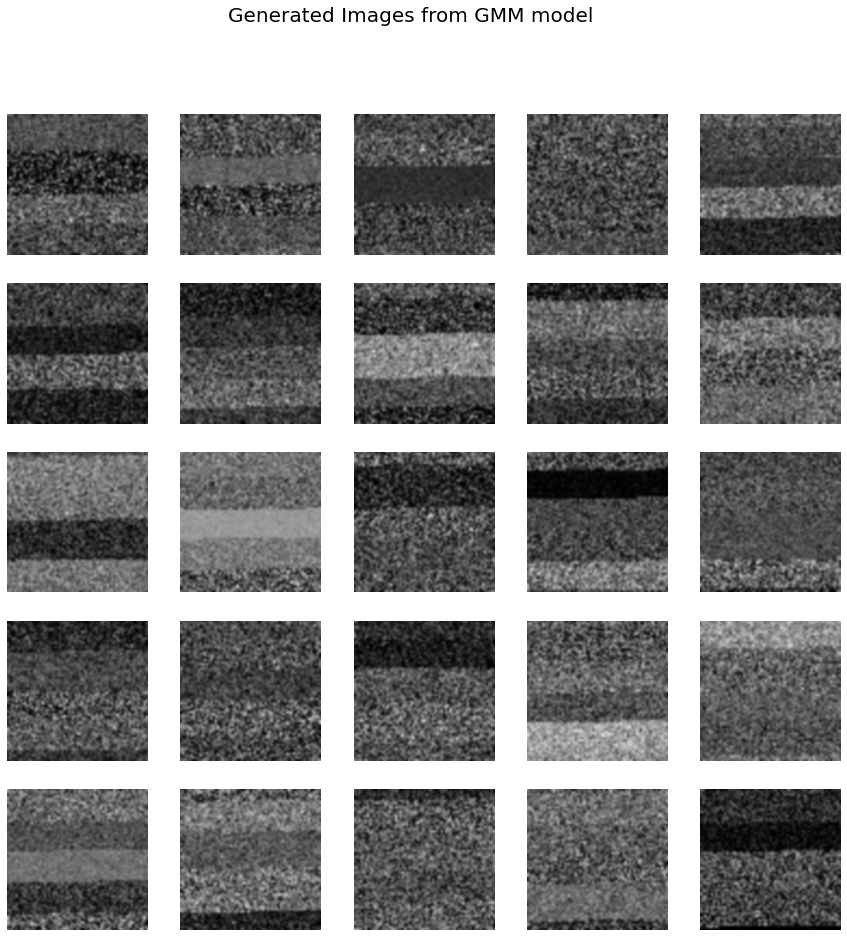

In [36]:
plot_images(sampled_out,"Generated Images from GMM model",n_images=25)

### Gaussian Mixture Model from scratch (based on GaussianMixture class)

In this part, I will attempt to replicate the results of the sci-kit part without using libraries from sci-kit. At this point, I am probably sure that if I managed to replicate the results of the previous part, my answers in part 2 will be the same since I still think that the model cannot properly fit the image datasets.

#### Expectation Maximization Algorithm for Gaussian Mixture Models
The EM Algorithm is used for fitting a dataset on GMM models. By using the algorithm, the different parameters needed is iteratively becomes more accurate that fits a gaussian distribution (per component).

1. Initializing Parameters - There are three main parameters used in GMM, mean ($\mu$), covariance($\Sigma$), and weights ($\pi$). In my setup, I mostly copied how to initialize the parameters on my main references.

2. E-Step (Computing the responsibilities) - In this step, the responsibility matrix is computed by using the formula below:

**Responsibilities Formula**
\begin{equation*}
    r_{nk}\,=\,\frac{\pi_{k}\,N(x_{n}|\mu_{k},\Sigma_{k})}{\sum_{j=1}^{K}\, \pi_{j}\, N(x_{n}|\mu_{j},\Sigma_{j})}
\end{equation*}

3. M-Step (Updating the parameters) - In this step, each parameter is updated based on the newly computed responsibility.

**Mean Update Formula**
\begin{equation*}
    \mu_{k}^{new}\,=\, \frac{\sum_{n=1}^{N}\,r_{nk}\,x_{n}}{\sum_{n=1}^{N}\,r_{nk}}
\end{equation*}
**Covariance Update Formula**
\begin{equation*}
    \Sigma_{k}^{new}\,=\,\frac{1}{N_k}\,\sum_{n=1}^{N}\,r_{nk}\,(x_{n}\,-\,\mu_{k})(x_{n}-\mu_{k})^{T}
\end{equation*}
**Weight Update Formula**
\begin{equation*}
    \pi_{k}^{new}\,=\,\frac{N_k}{N}
\end{equation*}
Where:
\begin{equation*}
    N_{k}\,=\,\sum_{n=1}^{N}\,\frac{\pi_{k}\,N(x_{n}|\mu_{k},\Sigma_{k})}{\sum_{j=1}^{K}\,\pi_{j}\,N(x_{n}|\mu_{k},\Sigma_{k})}\,=\,\sum_{n=1}^{N}\,r_{nk}
\end{equation*}

4. The E-Step and M-Step is iterated over until it reaches the specified number of iterations (in this case 100).

# GMM Function
 
This is based on the scikit-learn's function so the reults should be similar to the sci-kit examples. 

In [37]:
from scipy.stats import multivariate_normal
from scipy import linalg as la
from scipy.special import logsumexp
from sklearn import cluster
from sklearn.utils import check_random_state
from sklearn import metrics

#The GMM function here is purely based on the sklearn's Gaussian Mixture class. I decided to use this since I am having
#trouble creating a GMM model based on other's codes. I always encounter LinAlg Error (Singular value) or the processing time
#is way too long (1 iteration = 1 hour so I needed 100 hrs for 100 iteration)

#X is the projected points (z code of input)
def sk_based_gmm_fit(X,n_components,verbose=False):
    #initialization
    estimate_precision_error_message = (
        "Fitting the mixture model failed because some components have "
        "ill-defined empirical covariance (for instance caused by singleton "
        "or collapsed samples). Try to decrease the number of components, "
        "or increase reg_covar.")
    if verbose: 
        print("===========================================================================================")
        print("Starting EM Algorithm...")
        print("Initializing parameters...")
    n_samples, n_dim = X.shape
    
    resp = np.zeros((n_samples,n_components))
    label = cluster.KMeans(n_clusters = n_components,n_init=1,random_state = None).fit(X).labels_
    resp[np.arange(n_samples),label] = 1
    
    #Initialize paramaeters
    nk = resp.sum(axis=0) + 10 * np.finfo(resp.dtype).eps
    means = np.dot(resp.T,X)/nk[:,np.newaxis]
    covariances = np.empty((n_components,n_dim,n_dim))
    for comp in range(n_components):
        diff = X - means[comp]
        covariances[comp] = np.dot(resp[:,comp]*diff.T,diff)/nk[comp]
        covariances[comp].flat[::n_dim + 1] += 1e-6
    
    weights = nk/n_samples
    
    #chlesky matrix ((useful for speeding up processing of covariance matrix))
    precision_cholesky = np.empty((n_components,n_dim,n_dim))
    
    
    
    for k, cov in enumerate(covariances):
        try:
            cov_chol = la.cholesky(cov,lower=True)
        except la.LinAlgError:
            raise ValueError(estimate_precision_error_message)
        precision_cholesky[k] = la.solve_triangular(cov_chol,np.eye(n_dim),lower=True).T
        
    if verbose:
        print("Mean: {}, Covariances: {}, Weights: {}".format(means.shape,covariances.shape,weights.shape))
    if verbose: 
        print("===========================================================================================")
        print("Starting EM Algorithm...")
        print("Initializing parameters...")
    converged = False
    loops = 100
    max_lb = -np.infty
    lower_bound = (-np.infty)
    
    #Starting EM Algorithm
    for loop in range(loops):
        prev_lower_bound = lower_bound
        
        #E-step
        if verbose: 
            print("===========================================================================================")
            print("Iteration number: {}".format(loop))
            print("Starting E-Step...")
            
        #Getting estimated_log_gauss_probability
        log_det = (np.sum(np.log(precision_cholesky.reshape(n_components,-1)[:,::n_dim + 1]),1))
        
        log_prob = np.empty((n_samples,n_components))
        
        for k, (mu,prec_chol) in enumerate(zip(means, precision_cholesky)):
            y = np.dot(X,prec_chol) - np.dot(mu,prec_chol)
            log_prob[:,k] = np.sum(np.square(y), axis=1)
            
        #Here, the multivariate pdf formula is used but within a logarithm
        est_log_prob = -.5 * (n_dim * np.log(2 * np.pi) + log_prob) + log_det
        
        #Getting estimated_weighted_log_prob
        
        weighted_log_prob = est_log_prob + np.log(weights)
        
        #Getting log_resp
        log_prob_norm = logsumexp(weighted_log_prob,axis=1)
        
        with np.errstate(under="ignore"):
            #To ignore underflow
            log_resp = weighted_log_prob - log_prob_norm[:,np.newaxis]
        
        log_prob_norm = np.mean(log_prob_norm)
        #End of E-Step
        if verbose: 
            print("Responsibilities:")
            print("Shape: {}".format(np.exp(log_resp).shape))
            print("Values: {}".format(log_resp))
        #Start of M-Step
        #Updating the different parameters
        if verbose: 
            print("===========================================================================================")
            print("Starting M-Step...")
        #update resp
        resp = np.exp(log_resp)
        weights = resp.sum(axis=0) + 10 * np.finfo(resp.dtype).eps
        #update mean
        means = np.dot(resp.T,X)/nk[:,np.newaxis]
        #update covariances
        covariances = np.empty((n_components,n_dim,n_dim))
        for comp in range(n_components):
            diff = X - means[comp]
            covariances[comp] = np.dot(resp[:,comp]*diff.T,diff)/nk[comp]
            covariances[comp].flat[::n_dim + 1] += 1e-6
        #update weight
        weights /= n_samples
        
        #update precision cholesky
        precision_chol = np.empty((n_components, n_dim, n_dim))
        for k, covariance in enumerate(covariances):
            try:
                cov_chol = la.cholesky(covariance, lower=True)
            except la.LinAlgError:
                raise ValueError(estimate_precision_error_message)
            precision_chol[k] = la.solve_triangular(cov_chol,np.eye(n_dim),lower=True).T
        if verbose: 
            print("Parameter Shapes:")
            print("Mean: {}, Covariance: {}, Weights: {}".format(means.shape,covariances.shape,weights.shape))
            print("Values:")
            print("Mean: {}, Covariance: {}, Weights: {}".format(means,covariances,weights))
        lower_bound = log_prob_norm
        
        change = lower_bound - prev_lower_bound
        
        if abs(change) < 1e-3:
            converged = True
            #Comment break if you want to iterate through all loops without following convergence condition
            break
            
    if converged == True:
        print("EM Algorithm converged...")
    else:
        print("EM Algorithm did not converge. Try again...")
    
    
    #Last E-Step before end of function
    #so that the updated paramaters are taken into account
    log_det = (np.sum(np.log(precision_cholesky.reshape(n_components,-1)[:,::n_dim + 1]),1))
        
    log_prob = np.empty((n_samples,n_components))
        
    for k, (mu,prec_chol) in enumerate(zip(means, precision_cholesky)):
        y = np.dot(X,prec_chol) - np.dot(mu,prec_chol)
        log_prob[:,k] = np.sum(np.square(y), axis=1)
        
    #Here, the multivariate pdf formula is used but within a logarithm
    est_log_prob = -.5 * (n_dim * np.log(2 * np.pi) + log_prob) + log_det
        
    #Getting estimated_weighted_log_prob
        
    weighted_log_prob = est_log_prob + np.log(weights)
        
    #Getting log_resp
    log_prob_norm = logsumexp(weighted_log_prob,axis=1)
        
    with np.errstate(under="ignore"):
        #To ignore underflow
        log_resp = weighted_log_prob - log_prob_norm[:,np.newaxis]
        
    log_prob_norm = np.mean(log_prob_norm)
    
    return means,covariances,weights,log_resp.argmax(axis=1),precision_cholesky


### Fitting the unlabeled dataset z code to the GMM model


1. **Can we fit a 10-component GMM on the unlabeled dataset 𝒛 code vectors from PCA?**

The 10-component GMM can be fitted on the unlabeled dataset (projected points) as seen on the function above, it returned without errors. Also, (although the code is not included here) if the unlabeled dataset is used in the prediction of the labels, the GMM model will successfully predict the images with the min. label 0 and max label 9 (unlike in the other dataset where it cannot properly predict the images' labels).

In [38]:
%%time
#When the convergence flag is ignored (break statement commented), time is 1hr,10mins
#When the convergence flag is followed, time is 2-3 mins
n_components=10
means_sk,covariances_sk,weights_sk,log_resp_sk,precision_cholesky_sk = sk_based_gmm_fit(optimal_z_code_u,n_components,verbose=True)

Starting EM Algorithm...
Initializing parameters...
Mean: (10, 2046), Covariances: (10, 2046, 2046), Weights: (10,)
Starting EM Algorithm...
Initializing parameters...
Iteration number: 0
Starting E-Step...
Responsibilities:
Shape: (10000, 10)
Values: [[-1.73512851e+09 -1.29150606e+09 -1.89428113e+09 ...  0.00000000e+00
  -1.74406833e+09 -1.55888984e+09]
 [-1.74096346e+09 -1.29897867e+09 -1.90845455e+09 ...  0.00000000e+00
  -1.77485775e+09 -1.57218983e+09]
 [-1.73328736e+09 -1.28299219e+09 -1.89749651e+09 ...  0.00000000e+00
  -1.78019382e+09 -1.55318916e+09]
 ...
 [-1.78952774e+09  0.00000000e+00 -2.04010113e+09 ... -1.76624015e+09
  -1.71048736e+09 -1.48152878e+09]
 [-1.79872788e+09  0.00000000e+00 -2.00361286e+09 ... -1.80355060e+09
  -1.70654682e+09 -1.47230197e+09]
 [-1.80133145e+09  0.00000000e+00 -1.98071821e+09 ... -1.79477829e+09
  -1.69499922e+09 -1.43580389e+09]]
Starting M-Step...
Parameter Shapes:
Mean: (10, 2046), Covariance: (10, 2046, 2046), Weights: (10,)
Values:
Mean

Wall time: 1min 31s


### Predicting Cluster Labels by using the fitted GMM Model

Since after fitting, we have the necessary parameters (mean, covariance, and weights). The train and test dataset labels can now be predicted using these parameters.


2. **Can we use the GMM and labeled train set to assign labels to the 10 clusters in GMM?**

The model can predict and assign labels on the images of the train and test dataset. However,  I would not call this as successful since the model only assigned at most 3 labels on all the images so it will result in a very low accuracy. Also, I can't think of a way (aside from manually checking) to check the labels and verify if the labels of the prediction is the same as the true labels of the dataset.

In [39]:
def sk_based_gmm_predict(X,means,covariances,weights,precision_cholesky,verbose=False):
    n_samples, n_dim = X.shape
    n_components,_ = means.shape
    #Calculating the log_probabilities
    log_det = (np.sum(np.log(precision_cholesky.reshape(n_components,-1)[:,::n_dim +1]),1))
    log_prob = np.empty((n_samples,n_components))
    
    for k,(mu,prec_chol) in enumerate(zip(means,precision_cholesky)):
        y = np.dot(X,prec_chol) - np.dot(mu,prec_chol)
        log_prob[:,k] = np.sum(np.square(y),axis=1)
    
    est_log_prob = -0.5 * (n_dim * np.log(2*np.pi) + log_prob) + log_det
    
    est_log_weights = np.log(weights)
    #Getting the weighted log probabilities by using the log prob and log_weights since logX + logY = logXY
    est_weighted_log_prob = est_log_prob + est_log_weights
    
    return est_weighted_log_prob.argmax(axis=1)

In [40]:
sk_labels_test = sk_based_gmm_predict(optimal_z_code_test,means_sk,covariances_sk,weights_sk,precision_cholesky_sk)
print("Finished predicting cluster labels for test dataset")
print("Shape: {}, Min: {}, Max: {}".format(sk_labels_test.shape,min(sk_labels_test),max(sk_labels_test)))
print("===========================================================================================")
sk_labels_train = sk_based_gmm_predict(optimal_z_code_train,means_sk,covariances_sk,weights_sk,precision_cholesky_sk)
print("Finished predicting cluster labels for train dataset")
print("Shape: {}, Min: {}, Max: {}".format(sk_labels_train.shape,min(sk_labels_train),max(sk_labels_train)))
print("===========================================================================================")

Finished predicting cluster labels for test dataset
Shape: (8000,), Min: 1, Max: 5
Finished predicting cluster labels for train dataset
Shape: (5000,), Min: 1, Max: 5


### Separating labels per cluster

Similar to what I did in the previous part, I decided to process the labels by separating them by clusters.

The indexes returned in the process_labels() can be used to get the images on the original dataset (not projected). Also, based on the results of the classification, the GMM model can only classify the train and test dataset into **3 clusters** which is not accurate as there should be 500 data points for each clusters but the prediction can only managed to classify the datapoints into 3 clusters.

This shows that the GMM model (using the unlabeled z code) is not very accurate in classifying the labeled train and test dataset. I think at this point, even if I tried to test the accuracy of the test dataset, there would be very low percentage of accuracy.

In [41]:
print("Train Dataset")
train_truth_index_sk,train_truth_sk,train_pred_index_sk,train_pred_sk = process_labels(train_labels,cluster_names,sk_labels_train)
print("Test Dataset")
test_truth_index_sk,test_truth_sk,test_pred_index_sk,test_pred_sk = process_labels(test_labels,cluster_names,sk_labels_test)

Train Dataset
pred: {'deer': 1001, 'airplane': 3999}
truth: {'bird': 500, 'dog': 500, 'horse': 500, 'cat': 500, 'truck': 500, 'monkey': 500, 'deer': 500, 'ship': 500, 'airplane': 500, 'car': 500}
Test Dataset
pred: {'deer': 1810, 'airplane': 3190}
truth: {'horse': 513, 'monkey': 505, 'dog': 483, 'airplane': 500, 'cat': 529, 'bird': 507, 'deer': 491, 'truck': 485, 'car': 484, 'ship': 503}


### Images (from the original dataset) by cluster

Since in the process_labels(), we managed to sort the labels in terms of their value (cluster), we can extract the indices of the images from the prediction so that we can get the images (from the original dataset) and group them by cluster.

As shown below, the dictionaries per dataset are grouped whether they are the truth (output of the dataset) and prediction (based on the GMM model). In each of these dictionaries, there will be list of images (based on the indices from the previous part) that will be the images classified by the model.

In [42]:
import math
#Initializing Dictionaries
train_im_percluster_truth_sk = {}
train_im_percluster_pred_sk = {}
test_im_percluster_pred_sk = {}
test_im_percluster_truth_sk = {}

names = ['airplane','bird','car','cat','deer','dog','horse','monkey','ship','truck']

for name in names:
    #For Train Dataset
    #Getting list of images per cluster (Truth)
    train_im_percluster_truth_sk[name] = train[train_truth_index_sk[name]]
    #Getting list of images per cluster (Pred)
    if name in train_pred_index_sk.keys():
        train_im_percluster_pred_sk[name] = train[train_pred_index_sk[name]]
        
    #For Test Dataset
    #Getting list of images per cluster (Truth)
    test_im_percluster_truth_sk[name] = test[test_truth_index_sk[name]]
    #Getting list of images per cluster (Pred)
    if name in test_pred_index_sk.keys():
        test_im_percluster_pred_sk[name] = train[test_pred_index_sk[name]]
        
print("Train Truth Clusters: {}".format(train_im_percluster_truth_sk.keys()))
print("Train Pred Clusters: {}".format(train_im_percluster_pred_sk.keys()))
print("Test Truth Clusters: {}".format(test_im_percluster_truth_sk.keys()))
print("Test Pred Clusters: {}".format(test_im_percluster_pred_sk.keys()))

Train Truth Clusters: dict_keys(['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'])
Train Pred Clusters: dict_keys(['airplane', 'deer'])
Test Truth Clusters: dict_keys(['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'])
Test Pred Clusters: dict_keys(['airplane', 'deer'])


#### Plotting Test Images per cluster

n_ims: 9


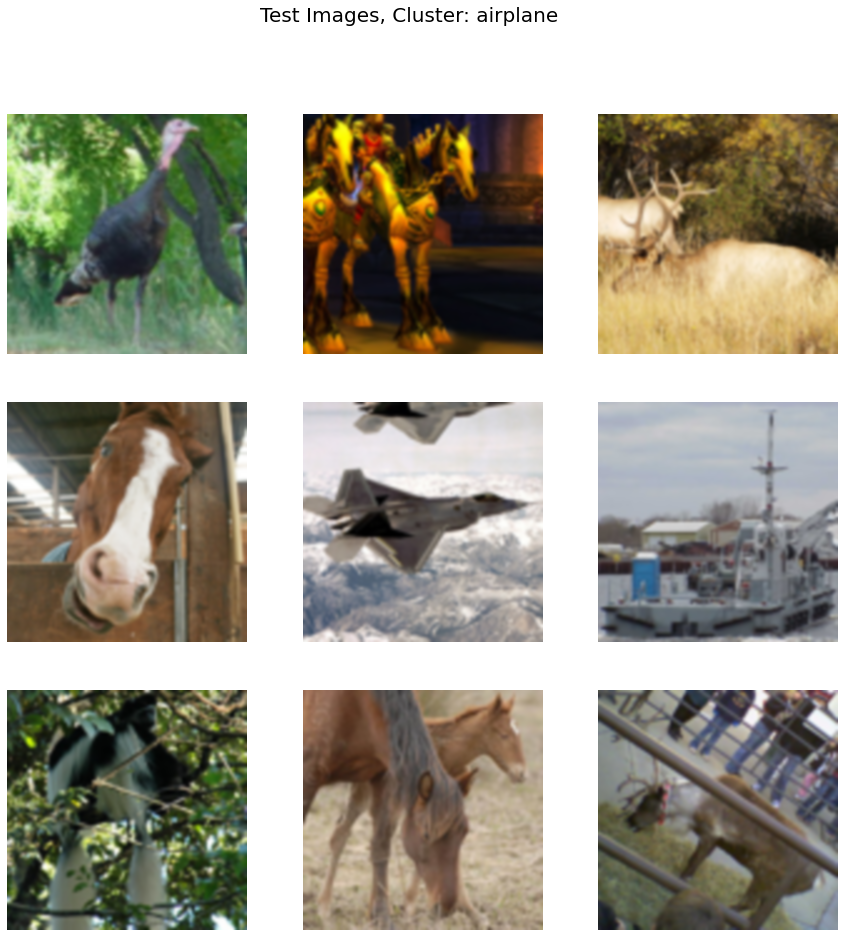

n_ims: 9


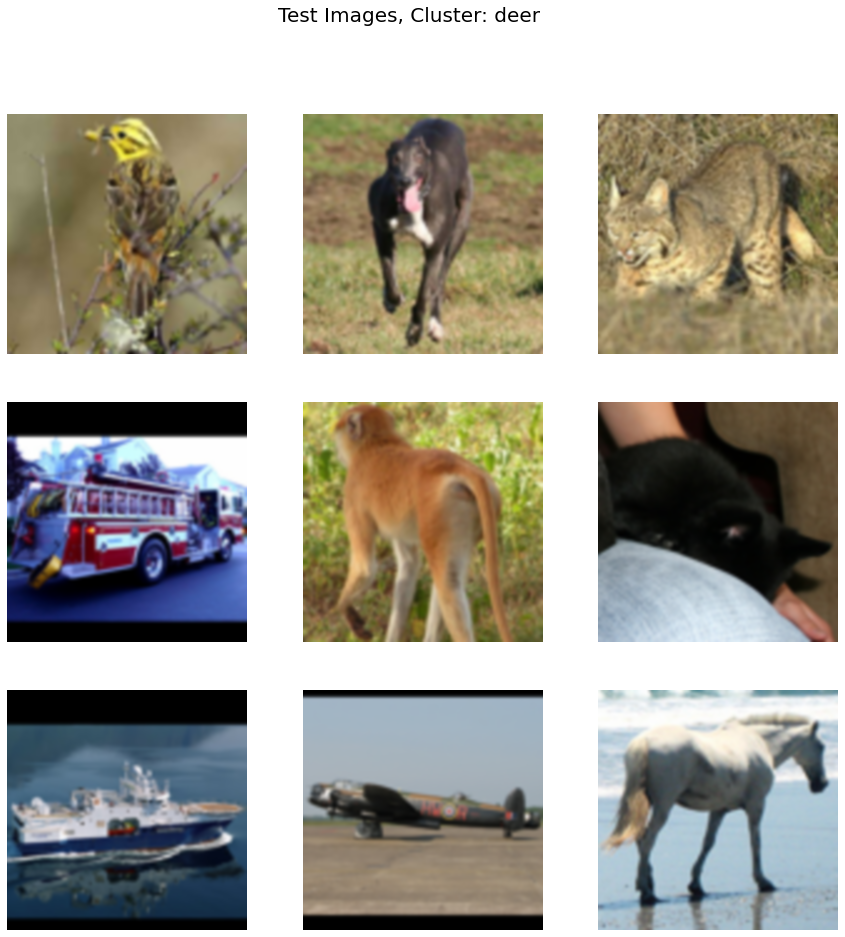

In [43]:
#Plotting Images classified per cluster (test dataset)
def check_if_square(n):
    check = math.sqrt(n)
    if int(check + 0.5)**2 == n:#n_ims is a perfect square
        return True
    else:
        return False
    
    
for name in names:
    if name in test_im_percluster_pred_sk.keys():
        n_ims = len(test_im_percluster_pred_sk[name])
        if check_if_square(n_ims):#n_ims is a perfect square
            if n_ims > 9:
                n_ims = 9
        else:
            while not check_if_square(n_ims):
                n_ims -= 1
                if n_ims < 3:
                    n_ims = 1
            if n_ims > 9:
                n_ims = 9
        print("n_ims: {}".format(n_ims))
        plot_images(test_im_percluster_pred_sk[name],"Test Images, Cluster: {}".format(name),n_images=n_ims)

#### Plotting Train Images per cluster

n_ims: 9


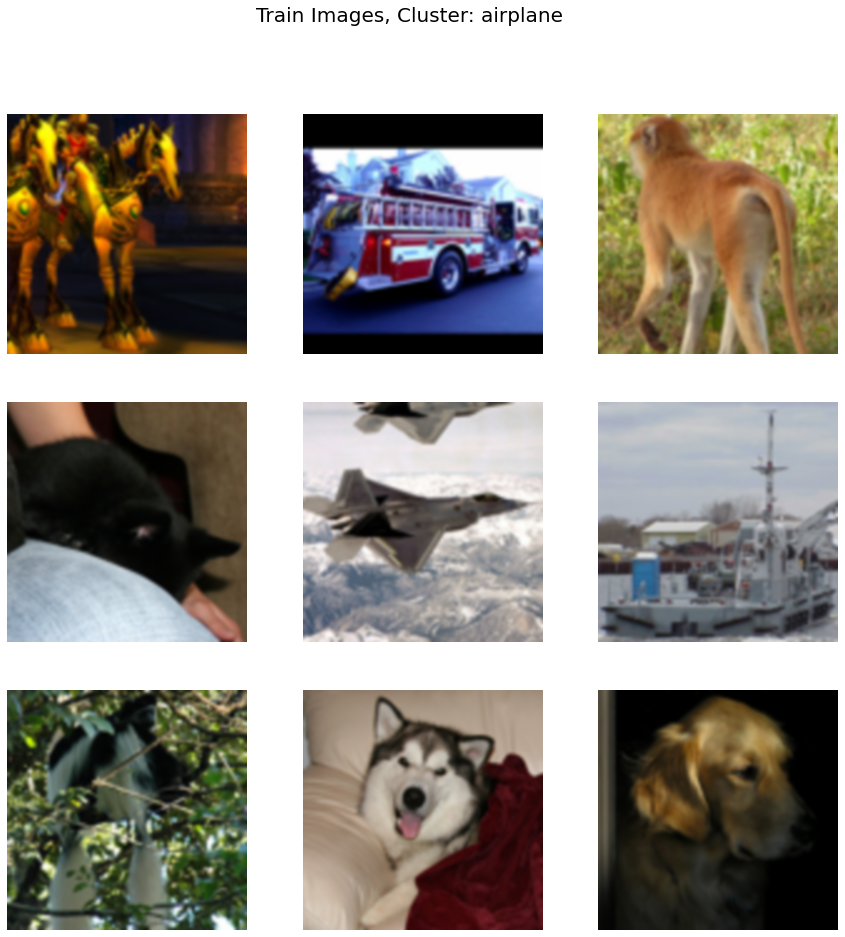

n_ims: 9


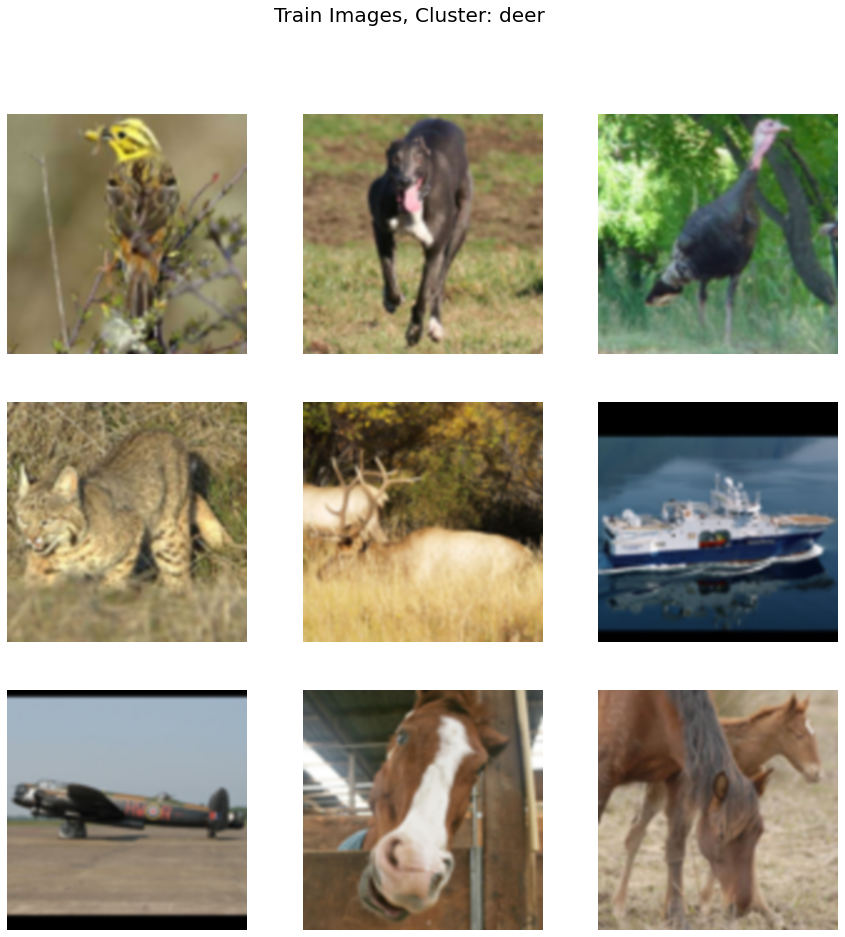

In [44]:
#Plotting Images classified per cluster (test dataset)
for name in names:
    if name in train_im_percluster_pred_sk.keys():
        n_ims = len(train_im_percluster_pred_sk[name])
        if check_if_square(n_ims):#n_ims is a perfect square
            if n_ims > 9:
                n_ims = 9
        else:
            while not check_if_square(n_ims):
                n_ims -= 1
                if n_ims < 3:
                    n_ims = 1
            if n_ims > 9:
                n_ims = 9
            
        print("n_ims: {}".format(n_ims))
        plot_images(train_im_percluster_pred_sk[name],"Train Images, Cluster: {}".format(name),n_images=n_ims)

#### Accuracy per cluster (Train Dataset)

In [45]:
%%time
acc_list_train_sk = accuracy_test_quicker(train_truth_index_sk,train_pred_index_sk,names)
print("Accuracy per cluster: {}".format(acc_list_train_sk))
print("Mean: {}%".format(np.mean(np.array(acc_list_train_sk))))

Currently in cluster: airplane....
Loop: 300, Matches: 18
Loop: 2000, Matches: 167
Loop: 2100, Matches: 176
Currently in cluster: deer....
Loop: 2300, Matches: 62
Accuracy per cluster: [79.60000000000001, 0, 0, 0, 24.0, 0, 0, 0, 0, 0]
Mean: 10.360000000000001%
Wall time: 123 ms


#### Accuracy (Total) Train Dataset

As shown in the code below, the accuracy of the GMM model is less than **10%** which is bad since it means that there are almost 5000 images in the train dataset so there are only about **500 matches**. As I said above, this is due to the assumption made before the accuracy test was done but since the model did not classify the images into 10 components (only at most 3 components), the accuracy test is moot.

In [46]:
%%time
acc_train_sk = accuracy_test_all(train_labels,sk_labels_train)
print("Total Accuracy: {}%".format(acc_train_sk))

Total Accuracy: 10.36%
Wall time: 15.2 ms


#### Accuracy per cluster (Test Dataset)

In [47]:
%%time
acc_list_test_sk = accuracy_test_quicker(test_truth_index_sk,test_pred_index_sk,names)
print("Accuracy per cluster: {}".format(acc_list_test_sk))
print("Mean: {}%".format(np.mean(np.array(acc_list_test_sk))))

Currently in cluster: airplane....
Loop: 3500, Matches: 196
Loop: 4900, Matches: 302
Currently in cluster: deer....
Accuracy per cluster: [62.6, 0, 0, 0, 34.82688391038696, 0, 0, 0, 0, 0]
Mean: 9.742688391038696%
Wall time: 135 ms


#### Accuracy (Total) Test Dataset
As shown in the code, the accuracy is similar to the train dataset with an accuracy of **10%**.

In [48]:
%%time
acc_test_sk = accuracy_test_all(test_labels,sk_labels_test)
print("Total Accuracy: {}%".format(acc_test_sk))

Total Accuracy: 9.8125%
Wall time: 20.1 ms


#### Plot of the Accuracy of Clusters per component

As shown in the graph below, the train and test dataset have similar cluster classification accuracy. So, I think that the problem lies on the unlabeled dataset. It might be insufficient in properly clustering the dataset.

Overall, the test dataset accuracy is low and it cannot be said that the model fitted the dataset well at this point. Again, this is due to the assumptions (label prediction and truth are not necessarily matching), and the reduction of information by converting to greyscale and resizing to a smaller size.

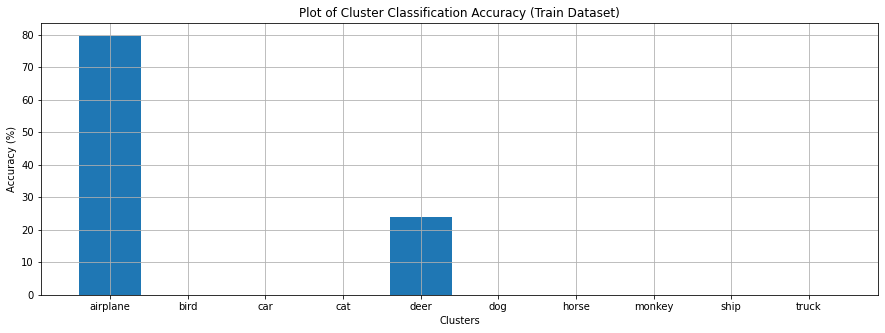

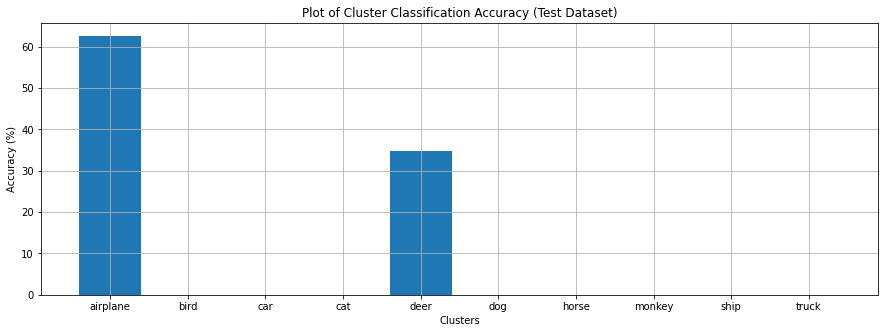

In [49]:
def plot_acc(acc_list,names,title):
    plt.figure(figsize=[15,5])
    plt.bar(names,acc_list)
    plt.grid(b=True,which="both",axis="both")
    plt.xticks(np.arange(10),names)
    plt.xlabel('Clusters')
    plt.ylabel('Accuracy (%)')
    plt.title(title)
    plt.show()
    

plot_acc(acc_list_train_sk,names,"Plot of Cluster Classification Accuracy (Train Dataset)")
plot_acc(acc_list_test_sk,names,"Plot of Cluster Classification Accuracy (Test Dataset)")

### Generating new samples
3. **Can we build an STL generative model using unlabeled dataset  PCA 𝒛 code vectors and GMM?**

As shown below, the GMM model **cannot** generate images that are similar to the other image datasets. I think this is mainly due to the ability of the model to successfully fit the image datasets. Since the model cannot properly assign the cluster labels to the train and test image datasets, I think that generating new images from the model will not be possible. Another problem might be lack of data since it may be because of lack of data since 10k unlabeled data was used for model fitting. Even if I tried to increase the samples, my current machine might not be able to handle such large amounts of data to process and the processing time might be too long.

In [50]:
def sk_based_gmm_sample(samples,means,covariances,weights,seed=None):
    
    
    trash, n_dim = means.shape
    #Here, using random generator and multivariate_normal to sample gaussian points based on the parameters from the fitting
    rng = check_random_state(seed)
    n_samples_comp = rng.multinomial(samples,weights)
    generated_samples = np.vstack([rng.multivariate_normal(mean,covariance,int(sample))for (mean,covariance,sample)in zip(means,covariances,n_samples_comp)])
    
    y = np.concatenate([np.full(sample,j,dtype=int) for j,sample in enumerate(n_samples_comp)])
    
    return (generated_samples,y)

In [51]:
sampled_gmm_sk,sampled_log_prob_sk = sk_based_gmm_sample(10000,means_sk,covariances_sk,weights_sk,seed=None)
print("sampled_gmm: {}".format(sampled_gmm_sk.shape))

#Reversing the PCA Transformation
sampled_R_sk = np.dot(optimal_principal_components_u,sampled_gmm_sk.T)
sampled_R_sk = sampled_R_sk.reshape((n_samples_unlabeled,input_w,input_h))
print("sampled_R: {}".format(sampled_R_sk.shape))
#Normalizing
sampled_out_sk = (sampled_R_sk * optimal_z_std_u) + optimal_z_mean_u
sampled_out_sk = np.clip(sampled_out_sk,0,255)
print("sampled_out: {}".format(sampled_out_sk.shape))

sampled_gmm: (10000, 2046)
sampled_R: (10000, 65, 65)
sampled_out: (10000, 65, 65)


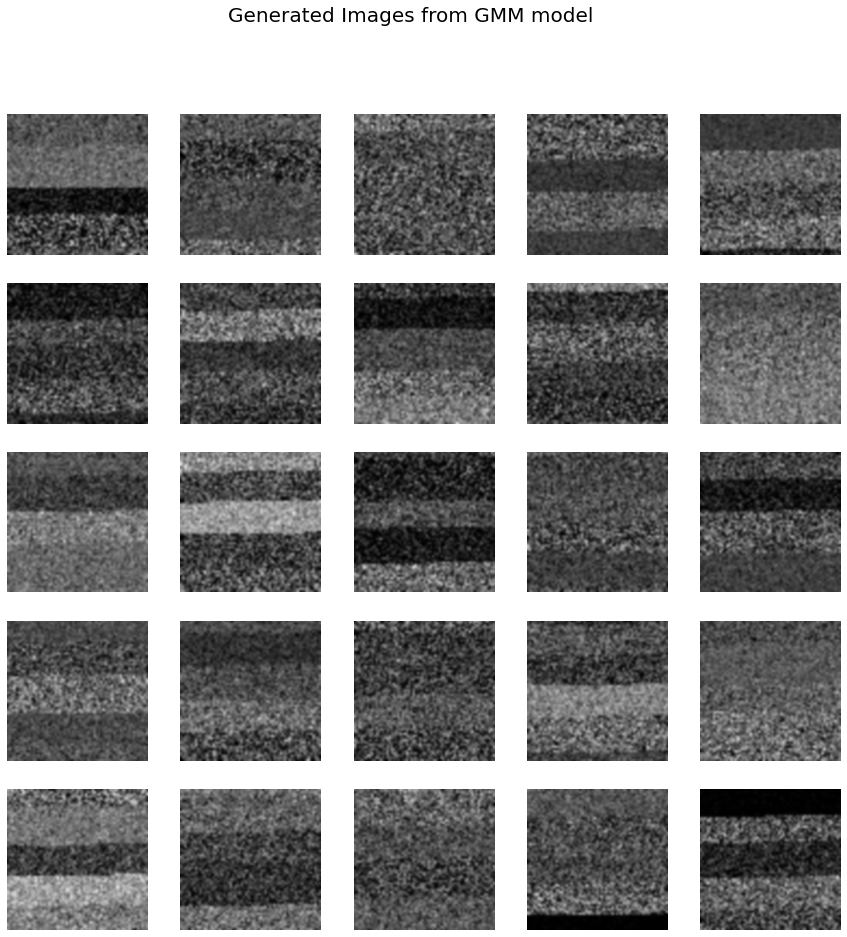

In [52]:
plot_images(sampled_out_sk,"Generated Images from GMM model",n_images=25)

# =============== END OF PART 2 ======================





# =============== END OF FINAL PROJECT ===================

### Failed GMM Codes

In [ ]:

gmm_components = 10
n_loop = 3
#At this point, I am using Prof. Atienza's GMM code as the main reference
def gmm_fit(z_code,dim,n_samples,n_components,n_loop):
    
    #Initializing the parameters 
    #Format: mean = (n_components,n_features/z-dim), 
    # covariance = (n_components,n_features,n_features), 
    # weights = (n_components,)
    print("===========================================================================================")
    print("Initializing parameters...")
    mean_gmm = np.random.normal(size=(n_components,dim))
    mean_gmm_shape = (n_components,dim)
    
    covar_gmm = np.array([np.identity(dim) for z in range(n_components)])
    covar_gmm_shape = covar_gmm.shape
    weights_gmm = np.random.randint(1,100,size=(n_components,))
    weights_gmm = weights_gmm/weights_gmm.sum()
    Q = np.zeros((n_samples,n_components))
    print("Parameter Shapes:")
    print("Mean: {}, Covariance: {}, Weights: {}, Resp: {}".format(mean_gmm.shape,covar_gmm.shape,weights_gmm.shape,Q.shape))
  #  print("Initial Parameters:")
   # print("Mean: {}, Covariance: {}, Weights: {}".format(mean_gmm,covar_gmm,weights_gmm))
    #Q = responsibilities
    
    
    
    neg_log_likelihood = []
    print("===========================================================================================")
    print("Starting EM Algorithm...")
    #Change to False if you don't like to see output of each part.
    verbose = True
    #Loop for n_loops loops
    for loop in range(n_loop):
        if verbose:
            print("===========================================================================================")
            print("At loop {}...".format(loop))
            print("===========================================================================================")
            print("Computing Normal Distribution Data (N(x|mu,sigma))...")
        #E-Step
        #Looping for each samples (10000)
        for n in range(n_samples):
            x_n = z_code[n,:]
            #print("zcode: {}, x_n:{}".format(z_code.shape,x_n.shape))
           
            
            #print("Inside Loop {}. In Loop {}...".format(n,comp))
            #weight_percomp = weights_gmm[comp]
            #mean_percomp = mean_gmm[comp,:]
            #covar_percomp = covar_gmm[comp,:,:]
                
            log_weight = np.log(weights_gmm)
            #Compuuting log(N(x|mu,sigma))
            a = len(mean_gmm) * np.log(2*np.pi)
            _,b = np.linalg.slogdet(covar_gmm)
            #print("x: {}, mean: {}".format(x_n.shape,mean_percomp.shape))
            y = np.linalg.solve(covar_gmm,x_n - mean_gmm)
            #print("diff: {}, y: {}".format((x_n-mean_gmm).shape,y.shape))
            d_m = x_n - mean_gmm
            c = np.array([np.dot(d_m[i], y[i]) for i in range(10)])
            
            g_val = -0.5*(a+b+c)
            #print("a: {}, b: {}, c: {}".format(a.shape,b.shape,c.shape))
            denom_val = g_val + log_weight
            #print("g_val: {}, log_weight: {}".format(g_val.shape,log_weight.shape))
            
            max_val = np.max(denom_val)
            ds = denom_val - max_val
            exp_sum = np.exp(ds).sum(axis=None)
            log_denom = max_val + np.log(exp_sum)
                
            q_n = np.exp(denom_val - log_denom)
            #print("q_n: {},Q_n: {}".format(q_n.shape,Q[n,:].shape))
            Q[n,:] = q_n
            if n%1000 == 0:
                print("n: {} Q: {}".format(n,Q.shape))  

    
        #M-Step
        denoms = np.sum(Q,axis=0)
        
        weights_gmm = denoms/n_samples
        print("Updating weights: {}".format(weights_gmm.shape))
        #Update means
        nums_mean = [np.dot(Q[:,com],z_code) for com in range(n_components)]
        for index, (num,d) in enumerate(zip(nums_mean,denoms)):
            if d > 0:
                mean_gmm[index,:] = num/d 
            else:
                mean_gmm[index,:] = np.zeros_like(num)
        
       
        print("Updating mean: {}".format(mean_gmm.shape))
        #update covariances
        for comp in range(n_components):
            mean_percomp = mean_gmm[comp,:]
            n_percomp = denoms[comp]
            
            outer_prod = np.zeros((dim,dim))
            for n in range(n_samples):
                resp_nc = Q[n,comp]
                xn = z_code[n,:]
                outer_prod += resp_nc * np.outer(xn - mean_percomp, xn - mean_percomp)
                
                if n_percomp > 0:
                    outer_prod = outer_prod / n_percomp
                else:
                    outer_prod = outer_prod
            covar_gmm[comp,:,:] = outer_prod
          
        print("Updating covar: {}".format(covar_gmm.shape))
        
    return mean_gmm,covar_gmm,weights_gmm,Q

In [ ]:
%%time
mean_gmm,covar_gmm,weights_gmm,neg_log_likelihood = gmm_fit(optimal_z_code_u.T[:,:1028],1028,n_samples_unlabeled,gmm_components,n_loop)

In [ ]:
%%time
mean_gmm,covar_gmm,weights_gmm,neg_log_likelihood = gmm_fit1(optimal_z_code_u.T[:,:1028],1028,n_samples_unlabeled,gmm_components,n_loop)

In [ ]:
from scipy.stats import multivariate_normal
gmm_components = 10
n_loop = 100
#At this point, I am using Prof. Atienza's GMM code as the main reference
def gmm_fit1(z_code,dim,n_samples,n_components,n_loop):
    
    #Initializing the parameters 
    #Format: mean = (n_components,n_features/z-dim), 
    # covariance = (n_components,n_features,n_features), 
    # weights = (n_components,)
    print("===========================================================================================")
    print("Initializing parameters...")
    mean_gmm = np.random.normal(size=(n_components,dim))
    mean_gmm_shape = (n_components,dim)
    
    covar_gmm = np.array([np.identity(dim) for z in range(n_components)])
    covar_gmm_shape = covar_gmm.shape
    weights_gmm = np.random.randint(1,100,size=(n_components,))
    weights_gmm = weights_gmm/weights_gmm.sum()
    Q = np.zeros((n_samples,n_components))
    print("Parameter Shapes:")
    print("Mean: {}, Covariance: {}, Weights: {}, Resp: {}".format(mean_gmm.shape,covar_gmm.shape,weights_gmm.shape,Q.shape))
  #  print("Initial Parameters:")
   # print("Mean: {}, Covariance: {}, Weights: {}".format(mean_gmm,covar_gmm,weights_gmm))
    #Q = responsibilities
    
    
    
    neg_log_likelihood = []
    print("===========================================================================================")
    print("Starting EM Algorithm...")
    #Change to False if you don't like to see output of each part.
    verbose = True
    #Loop for n_loops loops
    for loop in range(n_loop):
        if verbose:
            print("===========================================================================================")
            print("At loop {}...".format(loop))
            print("===========================================================================================")
            print("Computing Normal Distribution Data (N(x|mu,sigma))...")
        #E-Step
        #Looping for each samples (10000)
        for n in range(n_samples):
            if n%1000 == 0:
                print("Loop {}....".format(n/1000))
            x_n = z_code[n,:]
            #print("zcode: {}, x_n:{}".format(z_code.shape,x_n.shape))
            denom_vals = []
            
            #Looping for each clusters (10)
            for comp in range(n_components):
                #print("Inside Loop {}. In Loop {}...".format(n,comp))
                weight_percomp = weights_gmm[comp]
                mean_percomp = mean_gmm[comp,:]
                covar_percomp = covar_gmm[comp,:,:]
                
                log_weight_percomp = np.log(weight_percomp)
                #Compuuting log(N(x|mu,sigma))
                a = len(mean_percomp) * np.log(2*np.pi)
                _,b = np.linalg.slogdet(covar_percomp)
                #print("x: {}, mean: {}".format(x_n.shape,mean_percomp.shape))
                y = np.linalg.solve(covar_percomp,x_n - mean_percomp)
                print("x_n-mean: {}, y: {}".format((x_n - mean_percomp).shape,y.shape))
                c = np.dot(x_n - mean_percomp, y)
                print("a: {}, b: {}, c: {}".format(a.shape,b.shape,c.shape))
                g_val = -0.5*(a+b+c)
                #print("g_val: {}, log_weight: {}".format(g_val.shape,log_weight_percomp.shape))
                denom_vals.append(g_val + log_weight_percomp)
                max_val = np.max(denom_vals)
                ds = denom_vals - max_val
                exp_sum = np.exp(ds).sum(axis=None)
                log_denom = max_val + np.log(exp_sum)
                
                q_n = np.exp([num - log_denom for num in denom_vals])
                print("q_n: {},Q_n: {}".format(q_n.shape,Q[n,:].shape))
            Q[n,:] = q_n
            print("Q: {}".format(Q))    
    
        #M-Step
        denoms = np.sum(Q,axis=0)
        
        weights_gmm = denoms/n_samples
        
        #Update means
        nums_mean = [np.dot(Q[:,com],z_code) for com in range(n_components)]
        for index, (n,d) in enumerate(zip(nums_mean,denoms)):
            if d > 0:
                mean_gmm[index,:] = n/d 
            else:
                mean_gmm[index,:] = np.zeros_like(n)
        
        
        #update covariances
        for comp in range(n_components):
            mean_percomp = mean_gmm[comp,:]
            n_percomp = denoms[comp]
            
            outer_prod = np.zeros((dim,dim))
            for n in range(n_samples):
                resp_nc = Q[n,comp]
                xn = z_code[n,:]
                outer_prod += resp_nc * np.outer(xn - mean_percomp, xn - mean_percomp)
                
                if n_percomp > 0:
                    outer_prod = outer_prod / n_percomp
                else:
                    outer_prod = outer_prod
            covar_gmm[comp,:,:] = outer_prod
            
        
    return mean_gmm,covar_gmm,weights_gmm,neg_log_likelihood

In [ ]:
neg_log_likelihood

In [ ]:
from scipy.stats import multivariate_normal
gmm_components = 10
n_loop = 100
#At this point, I am using Prof. Atienza's GMM code as the main reference
def gmm_process(z_code,dim,n_samples,n_components,n_loop):
    
    #Initializing the parameters 
    #Format: mean = (n_components,n_features/z-dim), 
    # covariance = (n_components,n_features,n_features), 
    # weights = (n_components,)
    print("===========================================================================================")
    print("Initializing parameters...")
    mean_gmm = np.random.normal(size=(n_components,dim))
    mean_gmm_shape = (n_components,dim)
    
    covar_gmm = [np.identity(dim) for z in range(n_components)]
    covar_gmm_shape = np.array(covar_gmm).shape
    weights_gmm = np.random.randint(1,100,size=(n_components,1))
    weights_gmm = weights_gmm/weights_gmm.sum()
    print("Parameter Shapes:")
    print("Mean: {}, Covariance: {}, Weights: {}".format(mean_gmm.shape,np.array(covar_gmm).shape,weights_gmm.shape))
  #  print("Initial Parameters:")
   # print("Mean: {}, Covariance: {}, Weights: {}".format(mean_gmm,covar_gmm,weights_gmm))
    
    
    neg_log_likelihood = []
    print("===========================================================================================")
    print("Starting EM Algorithm...")
    #Change to False if you don't like to see output of each part.
    verbose = True
    #Loop for n_loops loops
    for loop in range(n_loop):
        if verbose:
            print("===========================================================================================")
            print("At loop {}...".format(loop))
            print("===========================================================================================")
            print("Computing Normal Distribution Data (N(x|mu,sigma))...")
            
            
        #Computing Normal distribution data (N(x|mu,sigma))
        random_var = [multivariate_normal(mean_gmm[each_component],covar_gmm[each_component]) for each_component in range(n_components) ]
        norm_val = np.array([random_var[each_component].pdf(z_code[each_component]) for each_component in range(n_components)])
        
        
        if verbose:
            print("norm_val shape: {}".format(norm_val.shape))
            print("Computing Negative Log-Likelihood....")

        #Computing Negative Log-Likelihood (Performance Metric)
        weighted_norm_val = np.array([weights_gmm[each_component]*random_var[each_component].pdf(z_code) for each_component in range(n_components)])
        weighted_norm_val = np.log(weighted_norm_val.sum(axis=0)).sum()
        neg_log_likelihood.append(-weighted_norm_val)
        if verbose:
            print("Negative Log Likelihood Shape: {}".format(weighted_norm_val.shape))
            print("Negative Log Likelihood: {}".format(-weighted_norm_val))
            print("===========================================================================================")
            print("Starting E-Step....")
            
            
        #Computing the responsibilities (E-Step)
        #Repeating the weights vector for every sample data point (pixel)
        #Shape: (n_components,n_samples)
        p = np.repeat(weights_gmm,z_code.shape[0],axis=1)
        print("p: {}".format(p.shape))
        #Getting denominator for responsibility
        norm_val_sum = np.multiply(p,norm_val)
        print("norm_val_sum: {}".format(norm_val_sum.shape))
        #Summation, then reshape (responsibility_denominator)
       
        norm_val_sum = norm_val_sum.sum(axis=0)
        print("norm_val_sum = {}".format(norm_val_sum.shape))
        norm_val_sum = np.reshape(norm_val_sum,(-1,norm_val_sum.shape[0]))
        
        #Repeat for each component to avoid nesting loops
        #Shape: (n_components,n_samples)
        norm_val_sum = np.repeat(norm_val_sum,n_components,axis=0)
        
        #Computing numerator
        resp_numer = np.multiply(p,norm_val)
        
        #Computing the responsibilities
        resp = np.divide(resp_numer,norm_val_sum)
        if verbose:
            print("Responsibility Shape: {}".format(resp.shape))
            print("Responsibility: {}".format(resp))
            print("===========================================================================================")
            print("Starting M-Step....")
        #Updating Parameters(M-Step)
        #Computing Nk
        Nk = resp.sum(axis=1)
        #Repeating for every components
        Nk = np.repeat(Nk,n_components,axis=0)
        
        #Update Parameter: Mean
        #Repeating responsibilites for each components since summation of weighted datapoint is needed
        resp = np.repeat(resp,n_components,axis=0)
        x_t = [z_code.transpose() for _ in range(n_components)]
        x_t = np.concatenate(x_t,axis=0)
        print("resp_mean: {}, x_t: {}".format(resp_mean.shape,x_t.shape))
        #Getting numerator
        mean_numer = np.multiply(resp_mean,x_t).sum(axis=1)
        #Getting mean
        #Reshaping as 1 vector for covariance calculations
        mean_gmm = np.divide(mean_numer,Nk).reshape((-1,1))
        
        #Update Parameter: Covariance Matrices
        #Centering data
        diff = x_t - mean_gmm
        diff_transpose = x_t.reshape((n_components,n_dim,-1))
        
        #Getting all multiplicands of product (before sumamtion)
        diff_resp = np.multiply(diff,resp).reshape((n_components,n_dim,-1))
        
        #Outer product of weighted centered data and centered data(transposed)
        covar_numer = [np.matmul(diff_resp[each_components],diff_transpose[each_component].transpose()) for each_component in range(diff_resp.shape[0])]
        
        #Getting N
        N = Nk.reshape((-1,1))
        N = np.repeat(N,n_components,axis=1).reshape((n_components,n_components,-1))
        
        #Getting updated covariance matrix
        covar_gmm = [np.divide(covar_numer[each_component],N[each_component]) for each_component in range(n_components)]
        
        #Update Parameter: Weights
        weight_num= Nk[::2]
        weights_num = weights_num.reshape(weights_gmm.shape)/z_code.shape[0]
        weights_gmm = weights_num.reshape(weights_gmm.shape)
        
        #Restore shape of Mean and covariance matrix
        mean_gmm = mean_gmm.reshape(mean_gmm_shape)
        covar_gmm = covar_gmm.reshape(covar_gmm_shape)
        
        #Show result of the EM algorithm
        if verbose:
            print("===========================================================================================")
            print("Mean Shape: {}".format(mean_gmm.shape))
            print("Mean: {}".format(mean_gmm))
            print("Covariance Shape: {}".format(covar_gmm.shape))
            print("Covariance: {}".format(covar_gmm))
            print("Weights Shape: {}".format(weights_gmm.shape))
            print("Weights: {}".format(weights_gmm))
        
    return mean_gmm,covar_gmm,weights_gmm,neg_log_likelihood

In [ ]:
mean_gmm,covar_gmm,weights_gmm,neg_log_likelihood = gmm_process(optimal_z_code_u,optimal_dim,n_samples_unlabeled,gmm_components,n_loop)